# unconstrained optimization 
Unconstrained optimization is the process of finding the maximum or minimum of a function without any restrictions or constraints on the variables. It is used in mathematics, machine learning, economics, and engineering to optimize functions when there are no limitations on the solution space.
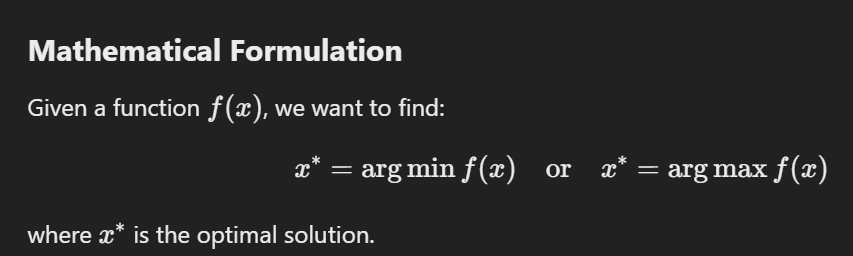
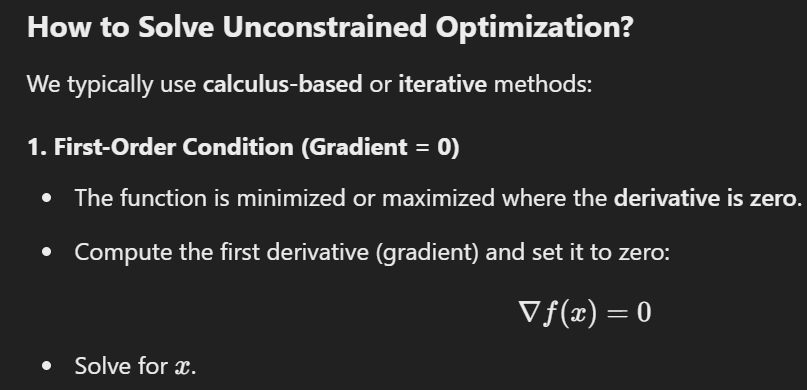
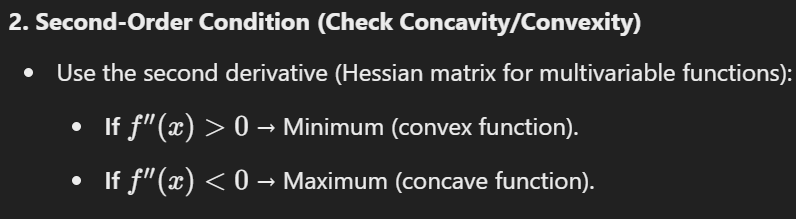
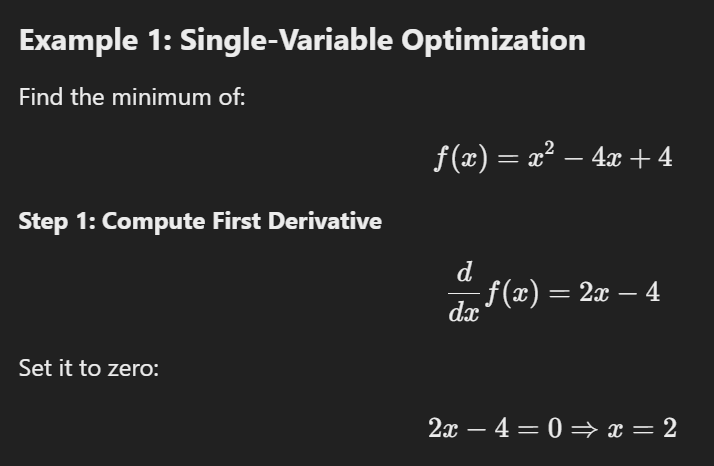
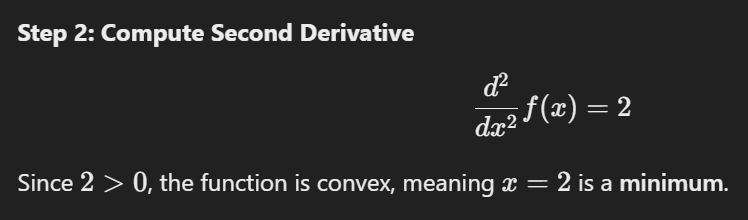
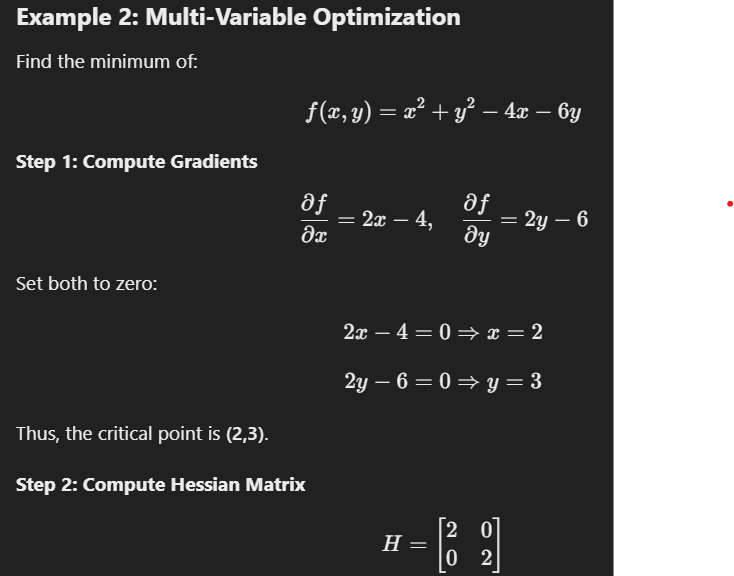
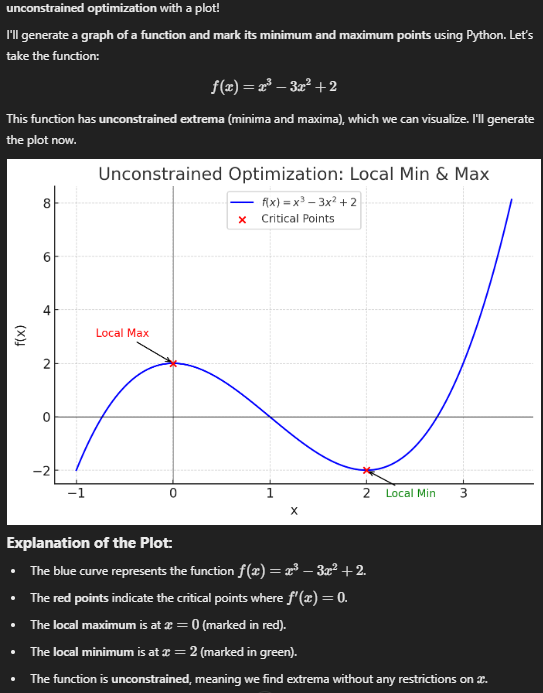

# Thermal Expansion 
# Linear Regression

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [4]:
import pandas as pd
import numpy as np

# Set random seed for reproducibility
np.random.seed(42)

# Number of samples to generate
num_samples = 1000

# Generate synthetic data
emails = [f'user{i}@example.com' for i in range(num_samples)]
addresses = [f'{np.random.randint(1000, 9999)} Random Street\nCity, ST {np.random.randint(10000, 99999)}' for _ in range(num_samples)]
avatars = np.random.choice(['Red', 'Blue', 'Green', 'Yellow', 'Black', 'White'], num_samples)
avg_session_length = np.random.normal(33, 1.5, num_samples)
time_on_app = np.random.normal(12, 1.5, num_samples)
time_on_website = np.random.normal(37, 2, num_samples)
length_of_membership = np.random.normal(3.5, 1, num_samples)

# Generate target variable with some relationship to features
yearly_amount_spent = (
    10 * avg_session_length +
    5 * time_on_app +
    3 * time_on_website +
    15 * length_of_membership +
    np.random.normal(0, 30, num_samples)  # Adding some noise
)

# Create DataFrame
df = pd.DataFrame({
    'Email': emails,
    'Address': addresses,
    'Avatar': avatars,
    'Avg. Session Length': avg_session_length,
    'Time on App': time_on_app,
    'Time on Website': time_on_website,
    'Length of Membership': length_of_membership,
    'Yearly Amount Spent': yearly_amount_spent
})

# Display first few rows
df.head()


,Email,Address,Avatar,Avg. Session Length,Time on App,Time on Website,Length of Membership,Yearly Amount Spent
0,user0@example.com,"8270 Random Street\nCity, ST 25795",Black,34.738523,12.260942,38.593992,2.433783,529.510050
1,user1@example.com,"1860 Random Street\nCity, ST 86820",Yellow,33.181677,10.441390,37.901478,5.879009,559.133863
2,user2@example.com,"6734 Random Street\nCity, ST 16265",Green,32.272549,12.024824,37.700022,4.054307,543.956477
3,user3@example.com,"1466 Random Street\nCity, ST 47194",White,34.163168,11.471917,35.694225,4.462416,541.615075
4,user4@example.com,"6578 Random Street\nCity, ST 54131",Black,29.423465,15.158752,39.586047,3.958891,572.833582


In [5]:
df.info

<bound method DataFrame.info of                    Email                             Address  Avatar  \
0      user0@example.com  8270 Random Street\nCity, ST 25795   Black   
1      user1@example.com  1860 Random Street\nCity, ST 86820  Yellow   
2      user2@example.com  6734 Random Street\nCity, ST 16265   Green   
3      user3@example.com  1466 Random Street\nCity, ST 47194   White   
4      user4@example.com  6578 Random Street\nCity, ST 54131   Black   
..                   ...                                 ...     ...   
995  user995@example.com  4374 Random Street\nCity, ST 35592   Green   
996  user996@example.com  1207 Random Street\nCity, ST 98733   Black   
997  user997@example.com  1632 Random Street\nCity, ST 78619  Yellow   
998  user998@example.com  4719 Random Street\nCity, ST 49891     Red   
999  user999@example.com  2679 Random Street\nCity, ST 91437   Black   

     Avg. Session Length  Time on App  Time on Website  Length of Membership  \
0              34.73852

In [6]:
df.describe()

,Avg. Session Length,Time on App,Time on Website,Length of Membership,Yearly Amount Spent
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,33.111145,11.988903,36.975615,3.495750,555.189741
std,1.553687,1.455798,1.954852,1.021197,36.889172
min,28.606573,7.140843,30.987511,-0.208797,428.634079
25%,32.104384,11.015696,35.703328,2.750884,530.083330
50%,33.181699,11.966756,36.995511,3.518430,554.598181
75%,34.114547,13.009602,38.209755,4.251047,579.931718
max,37.890737,16.326348,44.315404,6.340886,684.539566


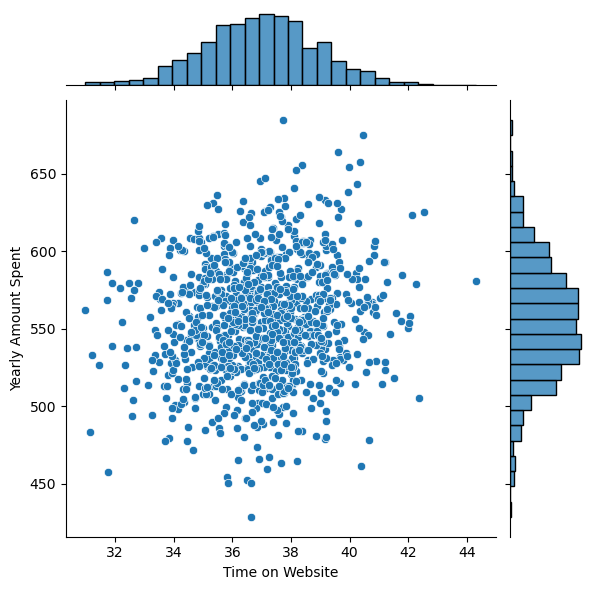

In [12]:
sns.jointplot(x='Time on Website',y='Yearly Amount Spent',data=df)
plt.show()

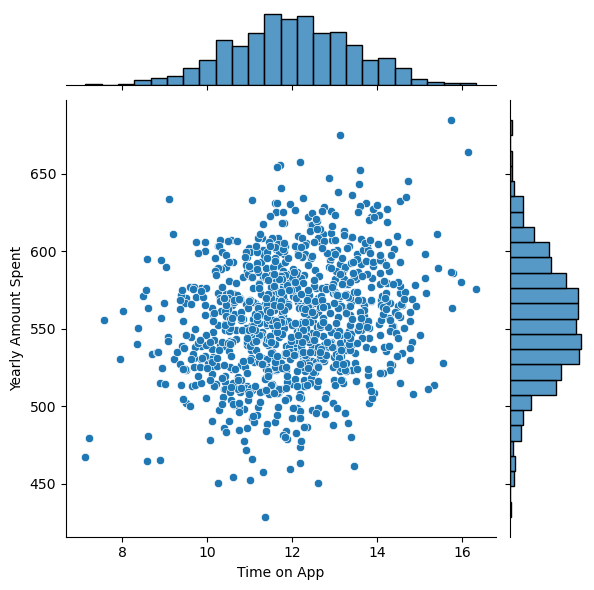

In [13]:
sns.jointplot(x='Time on App',y='Yearly Amount Spent',data=df)
plt.show()

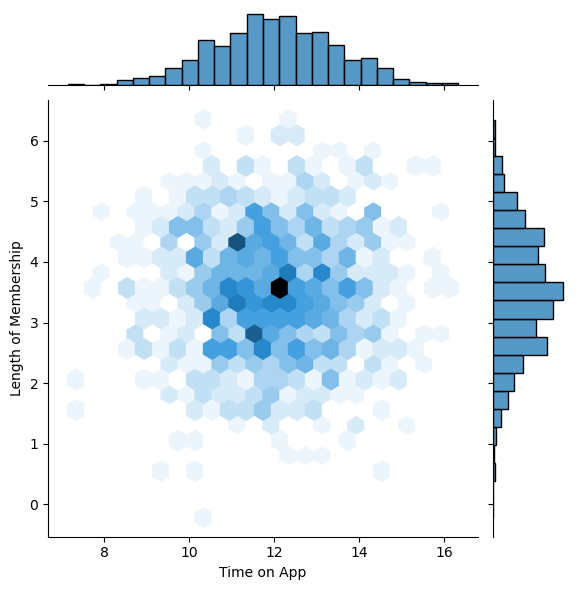

In [20]:
sns.jointplot(x='Time on App',y='Length of Membership',kind='hex',data=df)
plt.show()

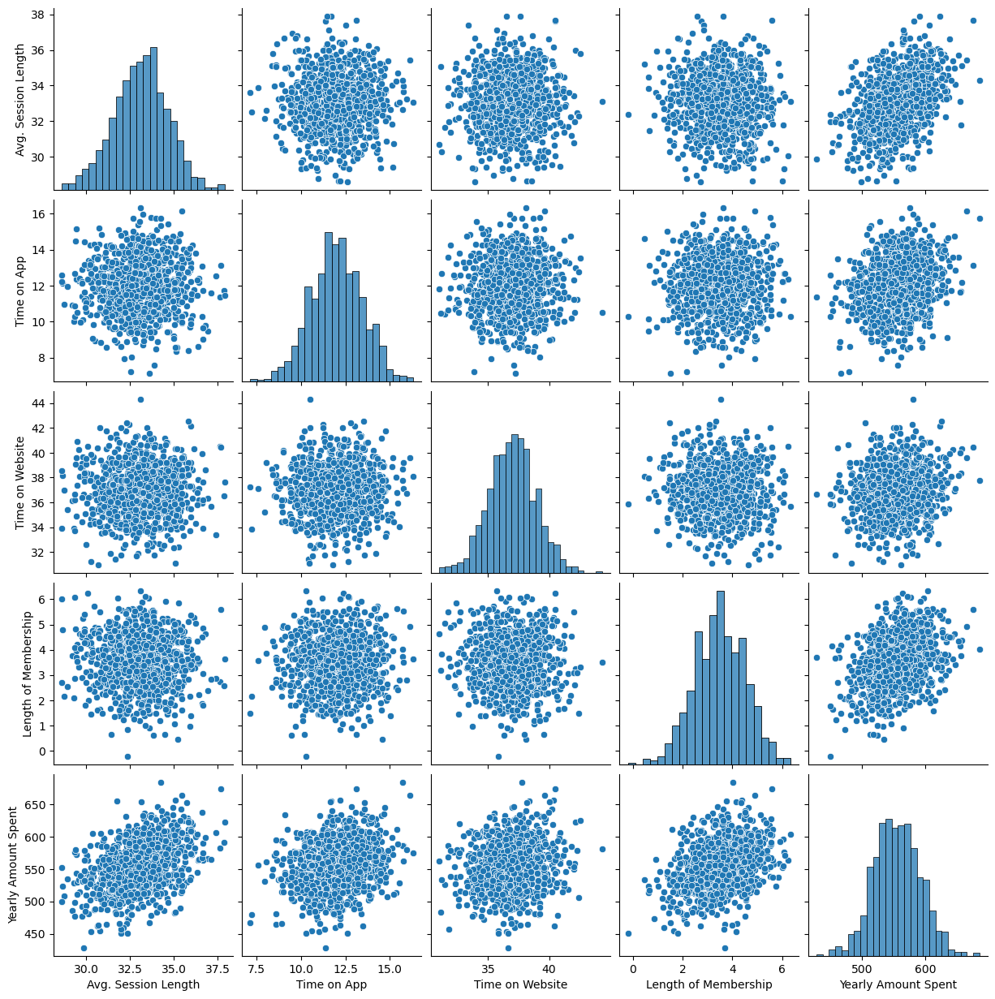

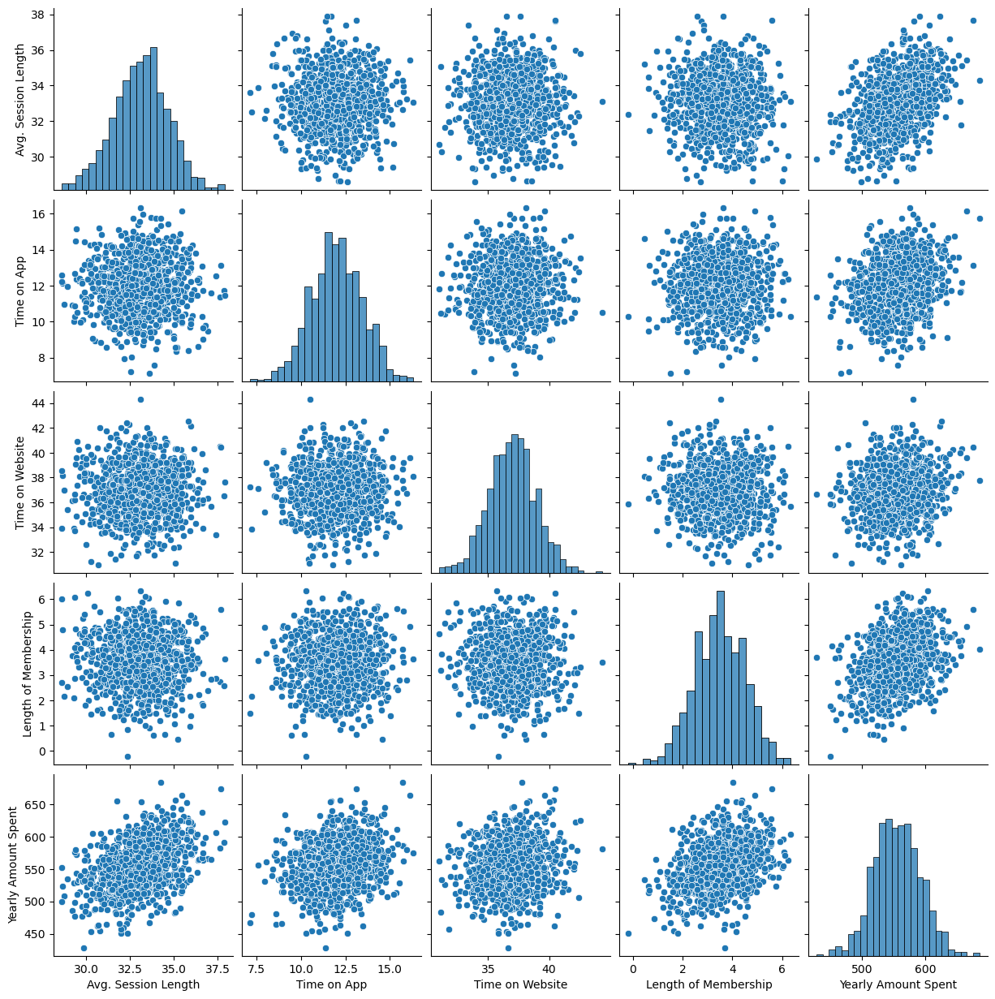

In [22]:
# sns.pairplot(df)
# # plt.show()
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure inline plotting (for Jupyter)
%matplotlib inline

sns.pairplot(df)
plt.show()  # Ensure the plot is displayed


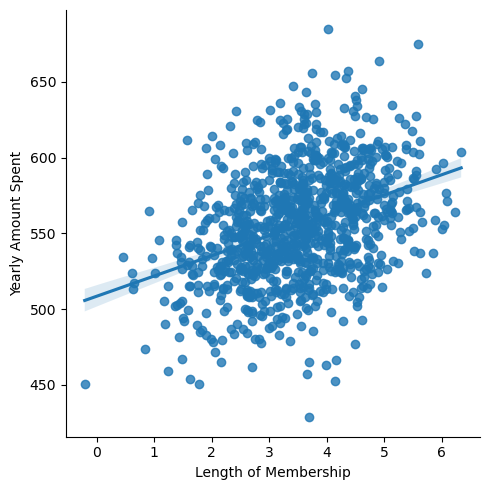

In [32]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.lmplot(x='Length of Membership',y='Yearly Amount Spent',data=df)
%matplotlib inline
plt.show()

In [33]:
df.columns

Index(['Email', 'Address', 'Avatar', 'Avg. Session Length', 'Time on App',
       'Time on Website', 'Length of Membership', 'Yearly Amount Spent'],
      dtype='object')

In [34]:
y=df['Yearly Amount Spent']

In [40]:
X=df[['Avg. Session Length', 'Time on App',
       'Time on Website', 'Length of Membership']]

In [44]:
from sklearn.model_selection import train_test_split

In [42]:
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.33, random_state=42)

In [45]:
from sklearn.linear_model import LinearRegression

In [49]:
lm=LinearRegression()
lm.fit(X_train,y_train)
lm.coef_

array([ 9.36557032,  5.4254766 ,  2.77755559, 14.08821265])

In [53]:
predictions= lm.predict(X_test)

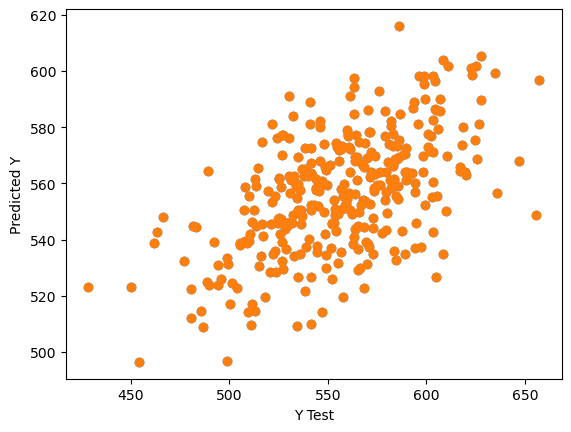

In [55]:
plt.scatter(y_test,predictions)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')
plt.show()

In [56]:
from sklearn import metrics

In [57]:
# calculate these metrics by hand!
from sklearn import metrics

print('MAE:', metrics.mean_absolute_error(y_test, predictions))
print('MSE:', metrics.mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, predictions)))

MAE: 24.934341582043082
MSE: 966.4803186390151
RMSE: 31.08826657501211


In [59]:
metrics.explained_variance_score(y_test,predictions)

0.3203307827159505

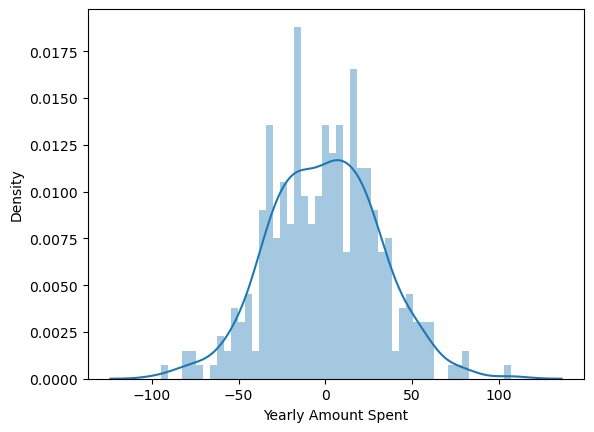

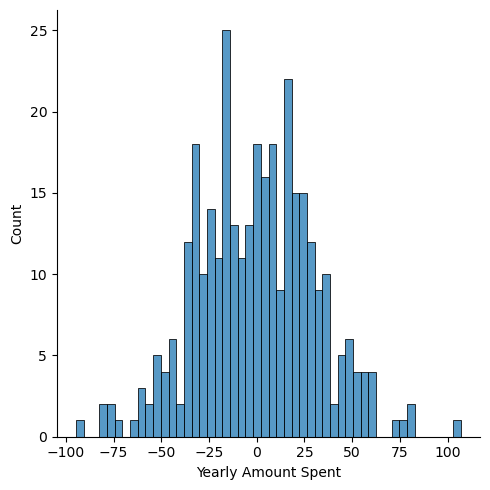

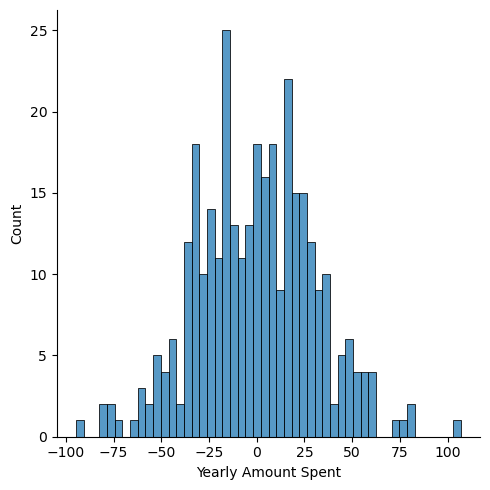

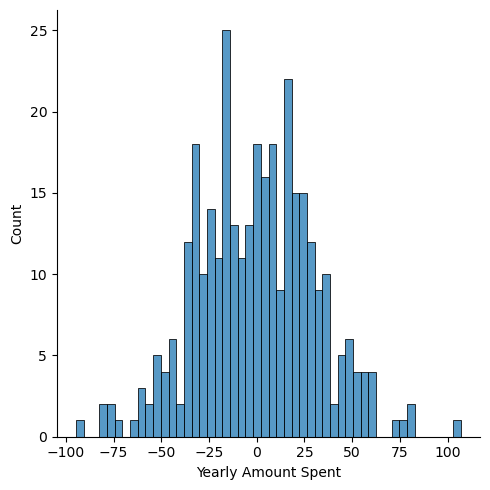

In [64]:
sns.displot((y_test-predictions),bins=50)
plt.show()

In [ ]:
coeffecients = pd.DataFrame(lm.coef_,X.columns)
coeffecients.columns = ['Coeffecient']
coeffecients

In [3]:
import pandas as pd

data = {
    "Temperature (°F)": [80, 60, 40, 20, 0, -20, -40, -60, -80, -100, -120, -140, -160, -180, -200, -220, -240, -260, -280, -300, -320, -340],
    "Coefficient of Thermal Expansion (α) [in/in°F]": [
        6.470e-6, 6.360e-6, 6.240e-6, 6.120e-6, 6.000e-6, 5.860e-6, 5.720e-6, 5.580e-6,
        5.430e-6, 5.280e-6, 5.090e-6, 4.910e-6, 4.720e-6, 4.520e-6, 4.300e-6, 4.080e-6,
        3.830e-6, 3.580e-6, 3.330e-6, 3.070e-6, 2.760e-6, 2.440e-6
    ]
}

df = pd.DataFrame(data)
(df)


,Temperature (°F),Coefficient of Thermal Expansion (α) [in/in°F]
0,80,0.000006
1,60,0.000006
2,40,0.000006
3,20,0.000006
4,0,0.000006
5,-20,0.000006
6,-40,0.000006
7,-60,0.000006
8,-80,0.000005
9,-100,0.000005


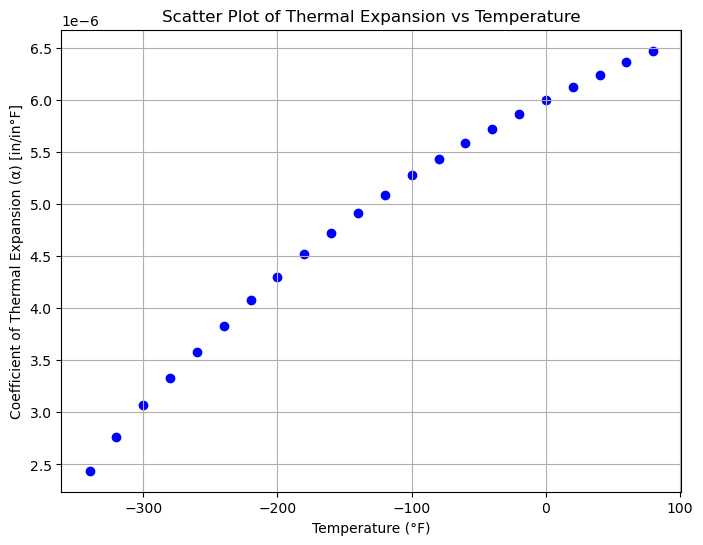

    Temperature (°F)  Coefficient of Thermal Expansion (α) [in/in°F]
0                 80                                        0.000006
1                 60                                        0.000006
2                 40                                        0.000006
3                 20                                        0.000006
4                  0                                        0.000006
5                -20                                        0.000006
6                -40                                        0.000006
7                -60                                        0.000006
8                -80                                        0.000005
9               -100                                        0.000005
10              -120                                        0.000005
11              -140                                        0.000005
12              -160                                        0.000005
13              -180              

In [4]:
import matplotlib.pyplot as plt
# Plot scatter plot
plt.figure(figsize=(8,6))
plt.scatter(df["Temperature (°F)"], df["Coefficient of Thermal Expansion (α) [in/in°F]"], color='blue', marker='o')
plt.xlabel("Temperature (°F)")
plt.ylabel("Coefficient of Thermal Expansion (α) [in/in°F]")
plt.title("Scatter Plot of Thermal Expansion vs Temperature")
plt.grid(True)
plt.show()

print(df)

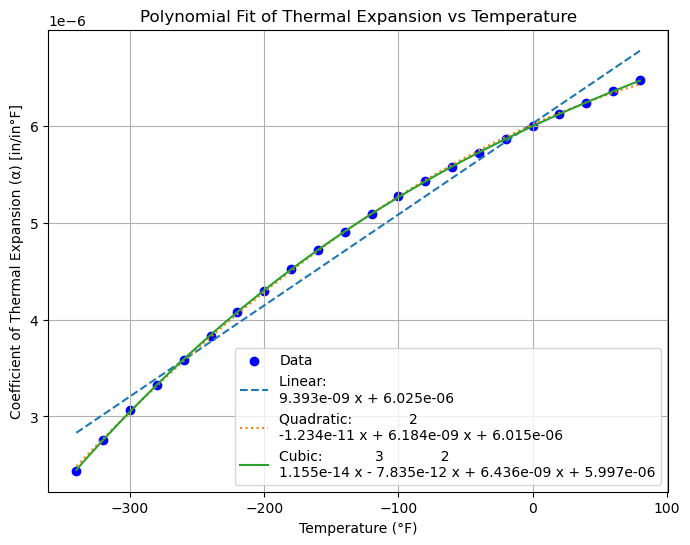

linear: [9.39271598e-09 6.02514399e-06] quadratic: [-1.23394269e-11  6.18446499e-09  6.01527244e-06] cubic_coeffs: [ 1.15499965e-14 -7.83492823e-12  6.43625492e-09  5.99725445e-06]


In [12]:
import numpy as np
# Fit polynomial models
x = np.array(df["Temperature (°F)"])
y = np.array(df["Coefficient of Thermal Expansion (α) [in/in°F]"])

# Linear fit
linear_coeffs = np.polyfit(x, y, 1)
linear_poly = np.poly1d(linear_coeffs)
# Quadratic fit
quadratic_coeffs = np.polyfit(x, y, 2)
quadratic_poly = np.poly1d(quadratic_coeffs)
# Cubic fit
cubic_coeffs = np.polyfit(x, y, 3)
cubic_poly = np.poly1d(cubic_coeffs)
# Generate fitted values
x_fit = np.linspace(min(x), max(x), 100)
y_linear = linear_poly(x_fit)
y_quadratic = quadratic_poly(x_fit)
y_cubic = cubic_poly(x_fit)
# Plot scatter plot and fitted curves
plt.figure(figsize=(8,6))
plt.scatter(x, y, color='blue', marker='o', label='Data')
plt.plot(x_fit, y_linear, label=f'Linear: {linear_poly}', linestyle='dashed')
plt.plot(x_fit, y_quadratic, label=f'Quadratic: {quadratic_poly}', linestyle='dotted')
plt.plot(x_fit, y_cubic, label=f'Cubic: {cubic_poly}', linestyle='solid')
plt.xlabel("Temperature (°F)")
plt.ylabel("Coefficient of Thermal Expansion (α) [in/in°F]")
plt.title("Polynomial Fit of Thermal Expansion vs Temperature")
plt.legend()
plt.grid(True)
plt.show()
print("linear:",linear_coeffs,"quadratic:",quadratic_coeffs,"cubic_coeffs:",cubic_coeffs )

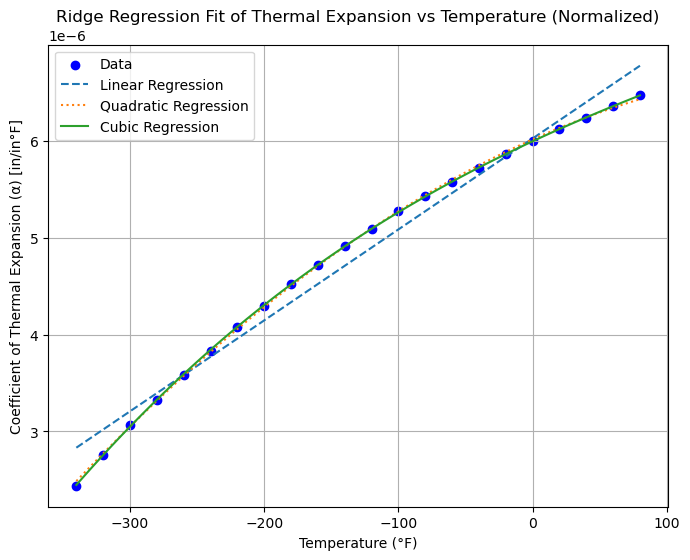

In [25]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import Ridge
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.pipeline import make_pipeline

data = {
    "Temperature (°F)": [80, 60, 40, 20, 0, -20, -40, -60, -80, -100, -120, -140, -160, -180, -200, -220, -240, -260, -280, -300, -320, -340],
    "Coefficient of Thermal Expansion (α) [in/in°F]": [
        6.470e-6, 6.360e-6, 6.240e-6, 6.120e-6, 6.000e-6, 5.860e-6, 5.720e-6, 5.580e-6,
        5.430e-6, 5.280e-6, 5.090e-6, 4.910e-6, 4.720e-6, 4.520e-6, 4.300e-6, 4.080e-6,
        3.830e-6, 3.580e-6, 3.330e-6, 3.070e-6, 2.760e-6, 2.440e-6
    ]
}

df = pd.DataFrame(data)

# Fit polynomial models
x = np.array(df["Temperature (°F)"]).reshape(-1, 1)
y = np.array(df["Coefficient of Thermal Expansion (α) [in/in°F]"])

# Ridge regression model with polynomial features and normalization
def ridge_regression(degree, alpha=0.1):
    model = make_pipeline(StandardScaler(), PolynomialFeatures(degree), Ridge(alpha=alpha))
    model.fit(x, y)
    return model

# Train regression models
ridge_linear = ridge_regression(1, alpha=0.01)
ridge_quadratic = ridge_regression(2, alpha=0.01)
ridge_cubic = ridge_regression(3, alpha=0.01)

# Generate predictions
x_fit = np.linspace(min(x), max(x), 100).reshape(-1, 1)
y_linear = ridge_linear.predict(x_fit)
y_quadratic = ridge_quadratic.predict(x_fit)
y_cubic = ridge_cubic.predict(x_fit)

# Plot scatter plot and regression curves
plt.figure(figsize=(8,6))
plt.scatter(x, y, color='blue', marker='o', label='Data')
plt.plot(x_fit, y_linear, label='Linear Regression', linestyle='dashed')
plt.plot(x_fit, y_quadratic, label='Quadratic Regression', linestyle='dotted')
plt.plot(x_fit, y_cubic, label='Cubic Regression', linestyle='solid')
plt.xlabel("Temperature (°F)")
plt.ylabel("Coefficient of Thermal Expansion (α) [in/in°F]")
plt.title("Ridge Regression Fit of Thermal Expansion vs Temperature (Normalized)")
plt.legend()
plt.grid(True)
plt.show()



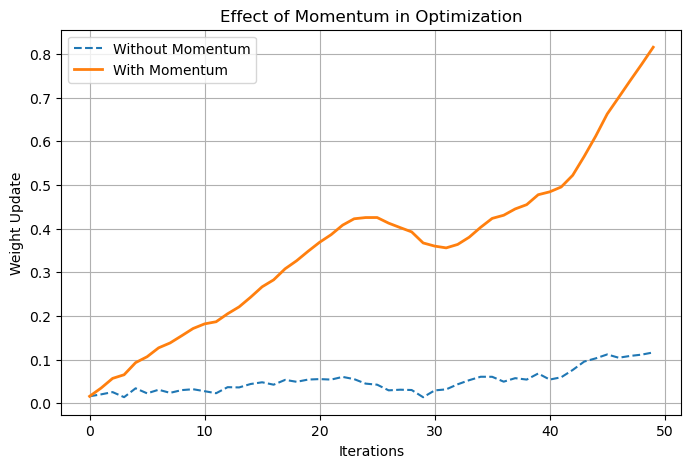

In [26]:
import numpy as np
import matplotlib.pyplot as plt

# Simulate gradient updates
iterations = 50
beta = 0.9  # Momentum coefficient
eta = 0.1   # Learning rate
gradients = np.random.randn(iterations) * 0.1  # Simulated noisy gradients

# Without Momentum
weights_no_momentum = []
w = 0
for g in gradients:
    w -= eta * g
    weights_no_momentum.append(w)

# With Momentum
weights_momentum = []
w = 0
v = 0
for g in gradients:
    v = beta * v - eta * g
    w += v
    weights_momentum.append(w)

# Plot results
plt.figure(figsize=(8, 5))
plt.plot(weights_no_momentum, label="Without Momentum", linestyle="dashed")
plt.plot(weights_momentum, label="With Momentum", linewidth=2)
plt.xlabel("Iterations")
plt.ylabel("Weight Update")
plt.title("Effect of Momentum in Optimization")
plt.legend()
plt.grid()
plt.show()


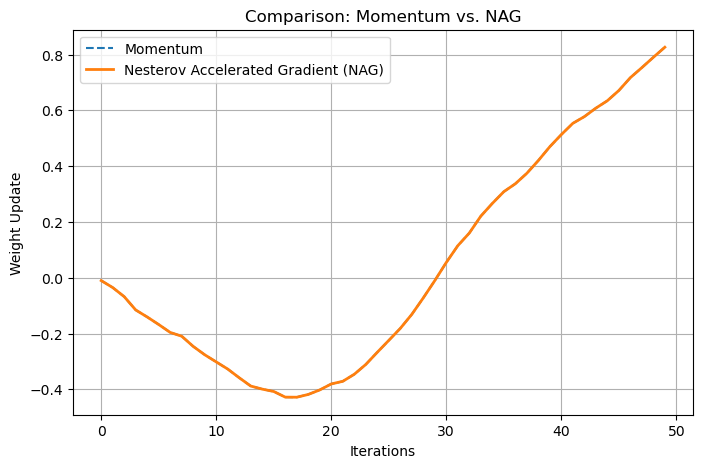

In [27]:
import numpy as np
import matplotlib.pyplot as plt

# Simulating gradient updates
iterations = 50
beta = 0.9  # Momentum coefficient
eta = 0.1   # Learning rate
gradients = np.random.randn(iterations) * 0.1  # Simulated noisy gradients

# Standard Momentum
W_momentum = []
w = 0
v = 0
for g in gradients:
    v = beta * v - eta * g
    w += v
    W_momentum.append(w)

# Nesterov Accelerated Gradient (NAG)
W_nag = []
w = 0
v = 0
for g in gradients:
    lookahead_w = w + beta * v  # Look ahead step
    v = beta * v - eta * g  # Compute velocity using the lookahead
    w += v  # Update weight
    W_nag.append(w)

# Plot results
plt.figure(figsize=(8, 5))
plt.plot(W_momentum, label="Momentum", linestyle="dashed")
plt.plot(W_nag, label="Nesterov Accelerated Gradient (NAG)", linewidth=2)
plt.xlabel("Iterations")
plt.ylabel("Weight Update")
plt.title("Comparison: Momentum vs. NAG")
plt.legend()
plt.grid()
plt.show()


# Nestrov accelerated gradient

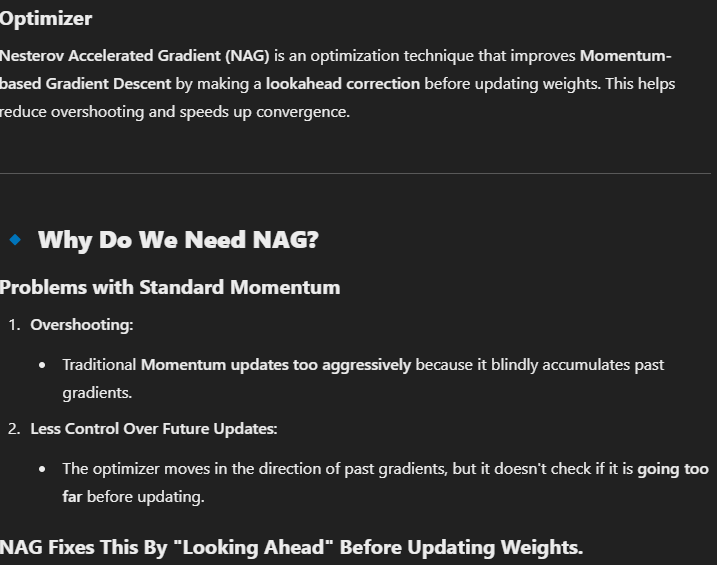
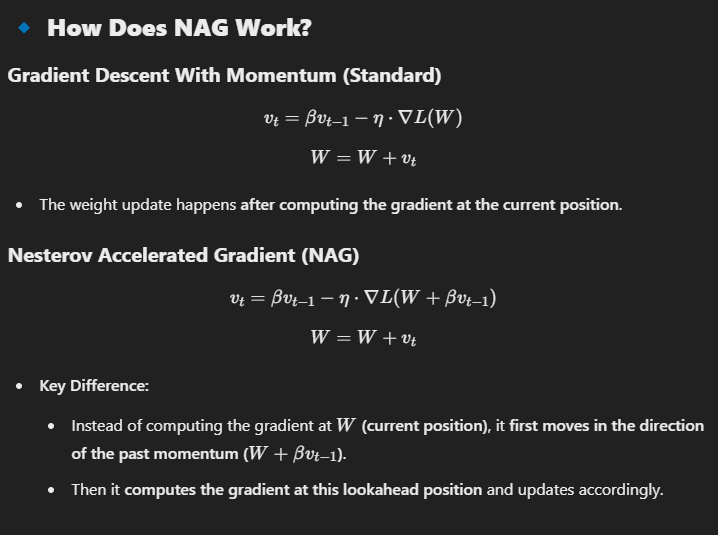
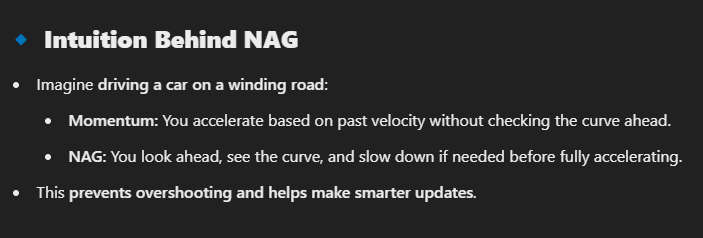

# Momentum 

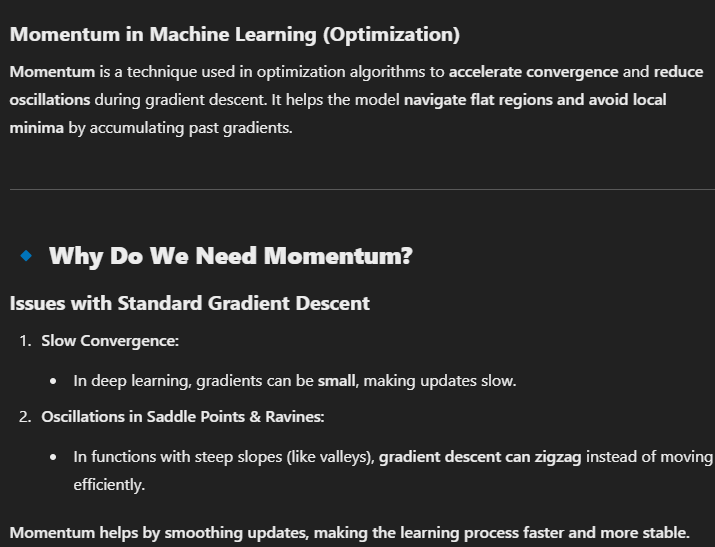
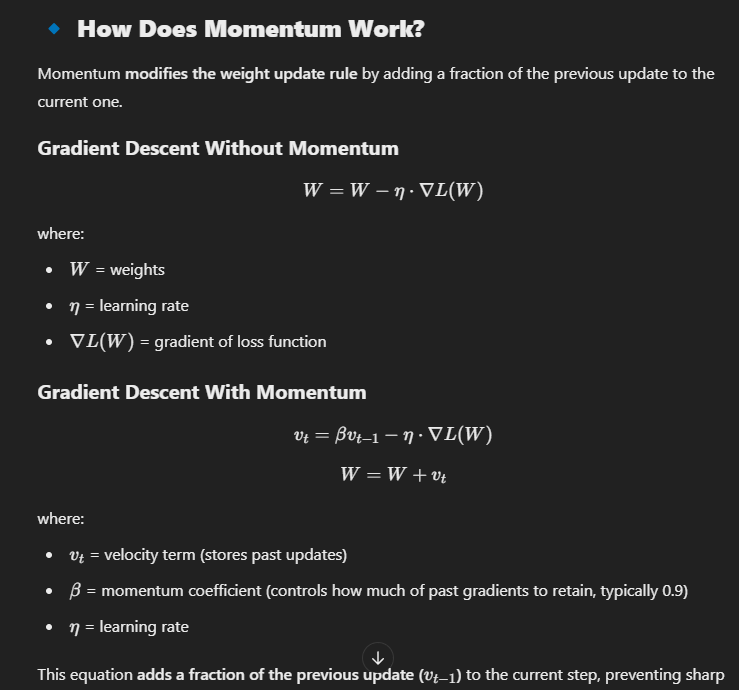
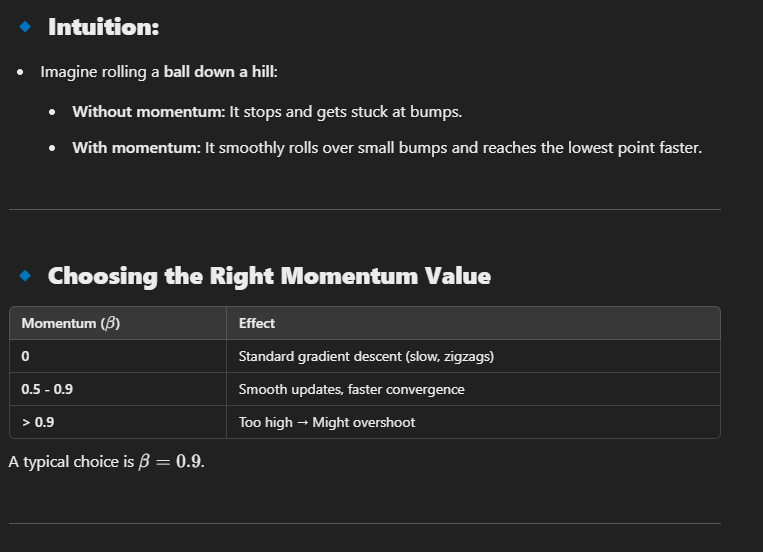

# Adgrad

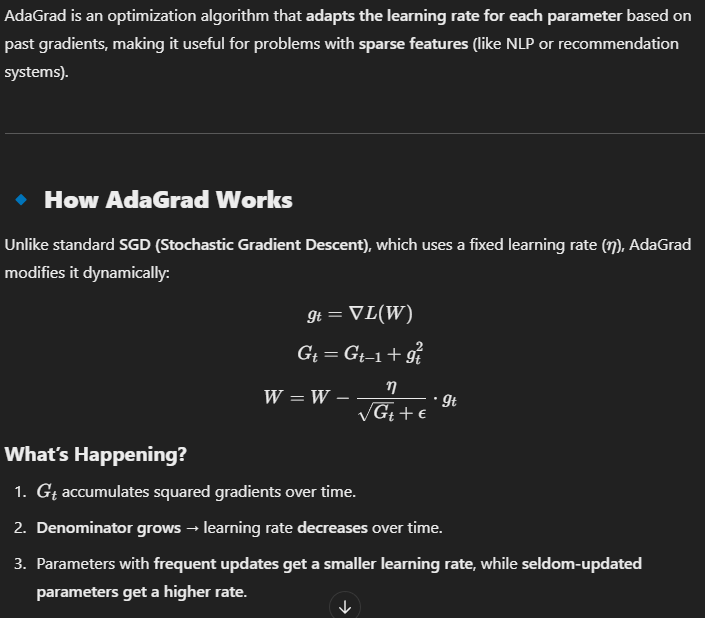


# RMS PROP & ADADELTA

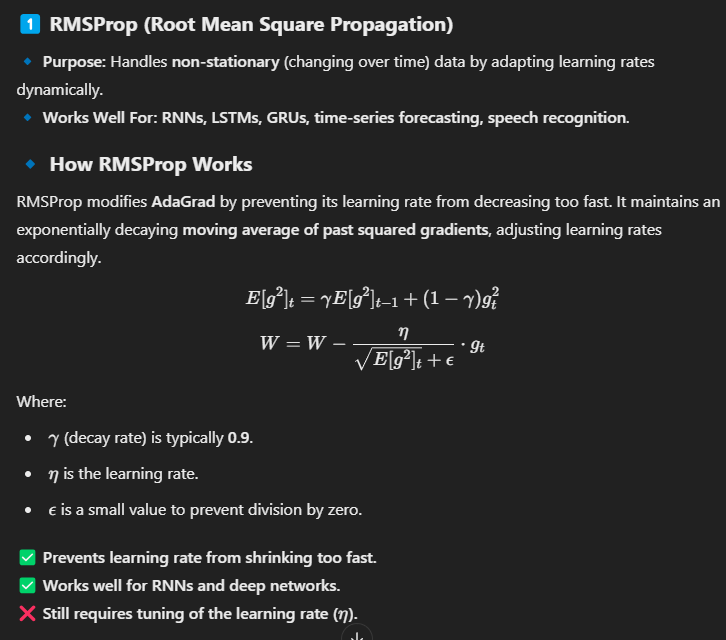
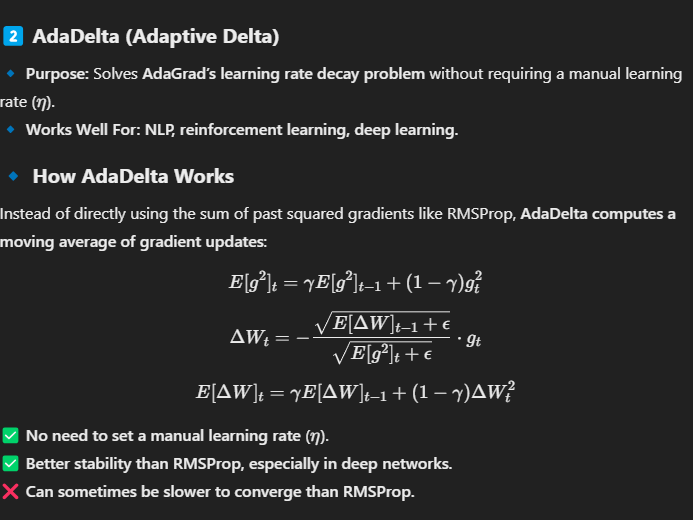


# Binary cross entropy

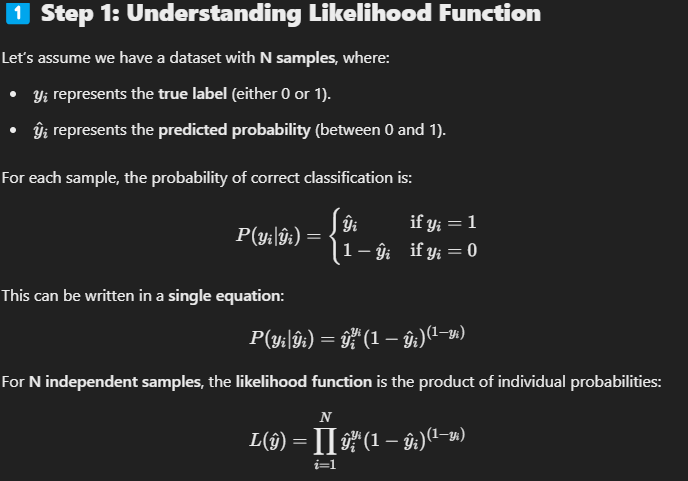
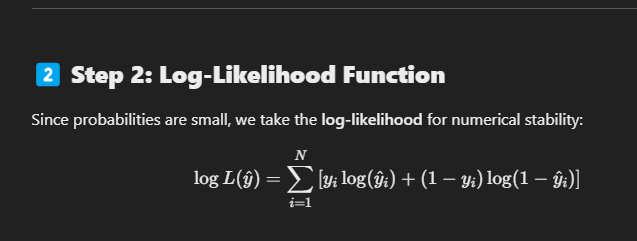
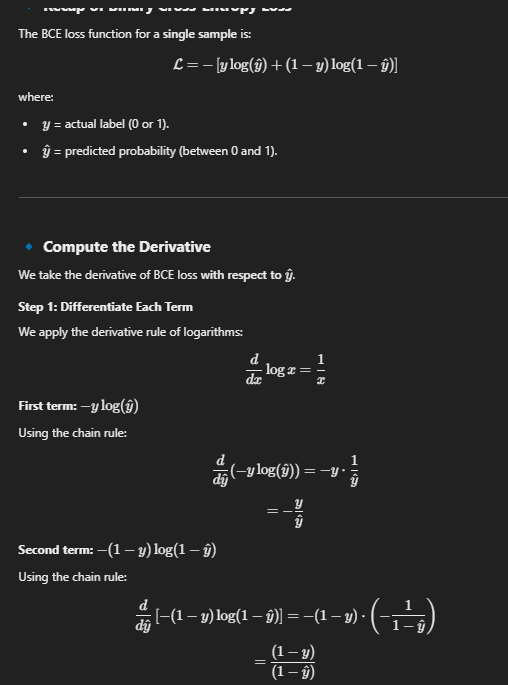


Accuracy: 0.98
Binary Cross-Entropy Loss: 0.05


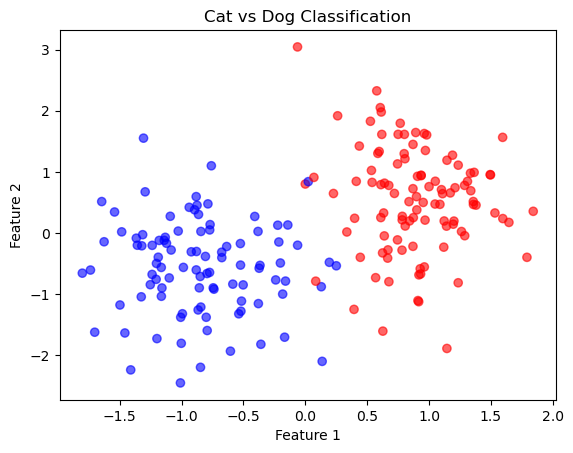

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, log_loss

# Generate synthetic data
np.random.seed(42)
num_samples = 1000

def generate_data(num_samples):
    # Features for cats (label 0)
    cats = np.random.normal(loc=[4, 2], scale=[1, 1.5], size=(num_samples // 2, 2))
    
    # Features for dogs (label 1)
    dogs = np.random.normal(loc=[8, 4], scale=[1, 1.5], size=(num_samples // 2, 2))
    
    # Combine data
    X = np.vstack((cats, dogs))
    y = np.hstack((np.zeros(num_samples // 2), np.ones(num_samples // 2)))
    
    return X, y

# Generate dataset
X, y = generate_data(num_samples)

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Train logistic regression model
model = LogisticRegression()
model.fit(X_train, y_train)

# Make predictions
y_pred_prob = model.predict_proba(X_test)[:, 1]
y_pred = model.predict(X_test)

# Compute accuracy and log loss
accuracy = accuracy_score(y_test, y_pred)
loss = log_loss(y_test, y_pred_prob)

print(f"Accuracy: {accuracy:.2f}")
print(f"Binary Cross-Entropy Loss: {loss:.2f}")

# Visualize the data
plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap='bwr', alpha=0.6)
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('Cat vs Dog Classification')
plt.show()


In [5]:
X

array([[4.49671415, 1.79260355],
       [4.64768854, 4.28454478],
       [3.76584663, 1.64879456],
       ...,
       [8.35144821, 5.60522536],
       [7.97347874, 2.67718802],
       [7.83693304, 2.88264603]])

# Multinominal classification cross entropy function
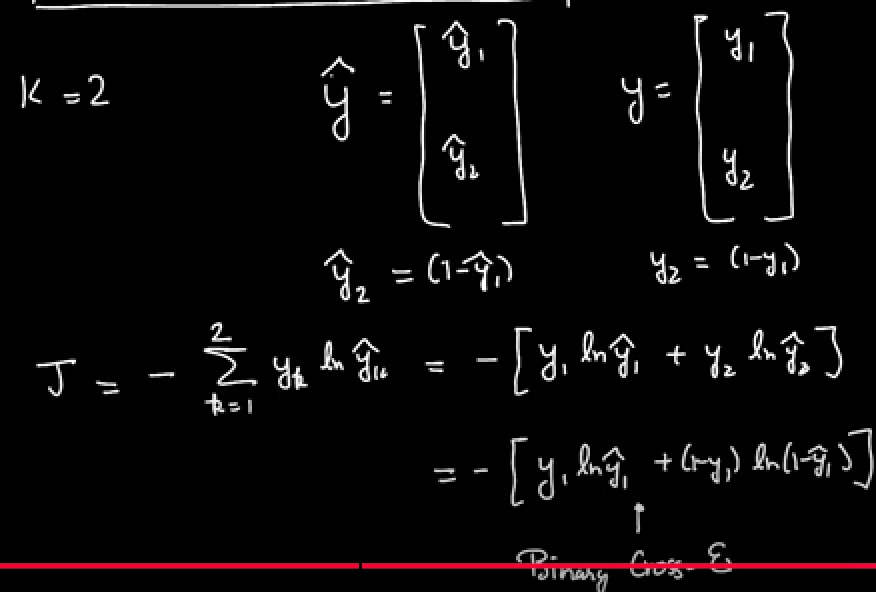
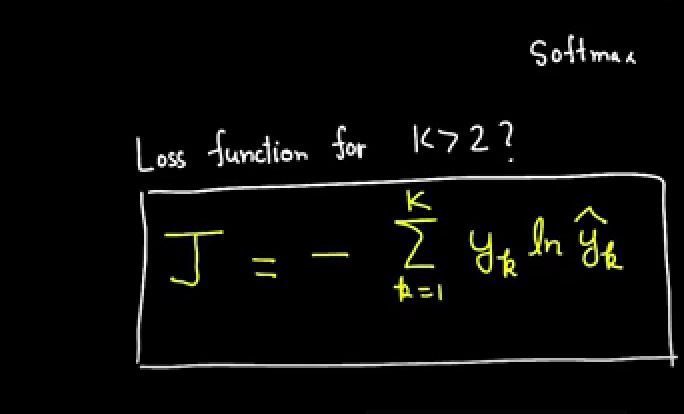

# K nearest neighbors

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [4]:
df = pd.read_csv(r"C:\Users\konde\Downloads\Py-DS-ML-Bootcamp-master\Refactored_Py_DS_ML_Bootcamp-master\14-K-Nearest-Neighbors\Classified Data")

In [5]:
df.head()

,Unnamed: 0,WTT,PTI,EQW,SBI,LQE,QWG,FDJ,PJF,HQE,NXJ,TARGET CLASS
0,0,0.913917,1.162073,0.567946,0.755464,0.780862,0.352608,0.759697,0.643798,0.879422,1.231409,1
1,1,0.635632,1.003722,0.535342,0.825645,0.924109,0.648450,0.675334,1.013546,0.621552,1.492702,0
2,2,0.721360,1.201493,0.921990,0.855595,1.526629,0.720781,1.626351,1.154483,0.957877,1.285597,0
3,3,1.234204,1.386726,0.653046,0.825624,1.142504,0.875128,1.409708,1.380003,1.522692,1.153093,1
4,4,1.279491,0.949750,0.627280,0.668976,1.232537,0.703727,1.115596,0.646691,1.463812,1.419167,1


In [9]:
from sklearn.preprocessing import StandardScaler

In [10]:
scaler = StandardScaler()

In [14]:
scaler.fit(df.drop(['TARGET CLASS'],axis=1))

# from sklearn.preprocessing import StandardScaler

# scaler = StandardScaler()

# # Correct the placement of axis inside drop()
# scaler.fit(df.drop(['TARGET CLASS'], axis=1))  


StandardScaler()

In [15]:
scaled_features = scaler.transform(df.drop(['TARGET CLASS'],axis=1))

In [16]:
scaled_features

array([[-1.73031962, -0.12354188,  0.18590747, ..., -1.48236813,
        -0.9497194 , -0.64331425],
       [-1.72685552, -1.08483602, -0.43034845, ..., -0.20224031,
        -1.82805088,  0.63675862],
       [-1.72339142, -0.78870217,  0.33931821, ...,  0.28570652,
        -0.68249379, -0.37784986],
       ...,
       [ 1.72339142,  0.64177714, -0.51308341, ..., -2.36249443,
        -0.81426092,  0.11159651],
       [ 1.72685552,  0.46707241, -0.98278576, ..., -0.03677699,
         0.40602453, -0.85567   ],
       [ 1.73031962, -0.38765353, -0.59589427, ..., -0.56778932,
         0.3369971 ,  0.01034996]])

In [17]:
from sklearn.model_selection import train_test_split

In [19]:
X=scaled_features
y=df['TARGET CLASS']
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=42)

In [20]:
from sklearn.neighbors import KNeighborsClassifier

In [21]:
knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=1)

In [22]:
pred = knn.predict(X_test)

In [24]:
from sklearn.metrics import classification_report,confusion_matrix,ConfusionMatrixDisplay

In [29]:
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

[[91  7]
 [ 6 96]]
              precision    recall  f1-score   support

           0       0.94      0.93      0.93        98
           1       0.93      0.94      0.94       102

    accuracy                           0.94       200
   macro avg       0.94      0.93      0.93       200
weighted avg       0.94      0.94      0.93       200



In [31]:
error_rate =[]
for i in range(1,40):
    knn = KNeighborsClassifier(n_neighbors = i)
    knn.fit(X_train,y_train)
    pred_i = knn.predict(X_test)
    error_rate.append(np.mean(pred_i!= y_test))

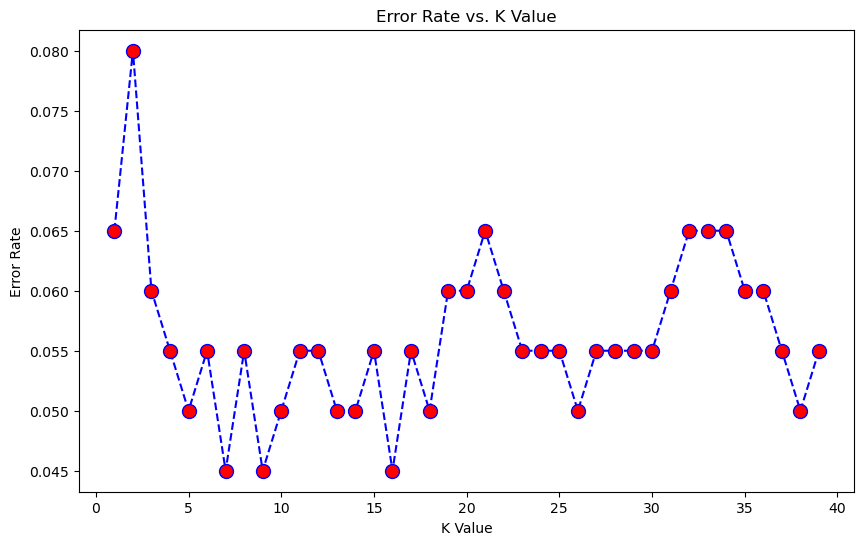

In [35]:
plt.figure(figsize=(10,6))
# plt.plot(range(1,40),error_rate,color='blue',line_style='dashed'marker='o',marker_style ='red',markersize='10')
# plt.title('error rate vs k value')
# plt.show()

import matplotlib.pyplot as plt

plt.plot(range(1, 40), error_rate, color='blue', linestyle='dashed', 
         marker='o', markerfacecolor='red', markersize=10)

plt.xlabel('K Value')
plt.ylabel('Error Rate')
plt.title('Error Rate vs. K Value')
plt.show()


In [36]:
knn = KNeighborsClassifier(n_neighbors=15)
knn.fit(X_train,y_train)
pred = knn.predict(X_test)

print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

[[94  4]
 [ 7 95]]
              precision    recall  f1-score   support

           0       0.93      0.96      0.94        98
           1       0.96      0.93      0.95       102

    accuracy                           0.94       200
   macro avg       0.95      0.95      0.94       200
weighted avg       0.95      0.94      0.95       200



# KNN project

In [38]:
df =pd.read_csv(r"C:\Users\konde\Downloads\Py-DS-ML-Bootcamp-master\Refactored_Py_DS_ML_Bootcamp-master\14-K-Nearest-Neighbors\KNN_Project_Data")

In [39]:
df.head()

,XVPM,GWYH,TRAT,TLLZ,IGGA,HYKR,EDFS,GUUB,MGJM,JHZC,TARGET CLASS
0,1636.670614,817.988525,2565.995189,358.347163,550.417491,1618.870897,2147.641254,330.727893,1494.878631,845.136088,0
1,1013.402760,577.587332,2644.141273,280.428203,1161.873391,2084.107872,853.404981,447.157619,1193.032521,861.081809,1
2,1300.035501,820.518697,2025.854469,525.562292,922.206261,2552.355407,818.676686,845.491492,1968.367513,1647.186291,1
3,1059.347542,1066.866418,612.000041,480.827789,419.467495,685.666983,852.867810,341.664784,1154.391368,1450.935357,0
4,1018.340526,1313.679056,950.622661,724.742174,843.065903,1370.554164,905.469453,658.118202,539.459350,1899.850792,0


In [40]:
sns.pairplot(df,hue='TARGET CLASS')

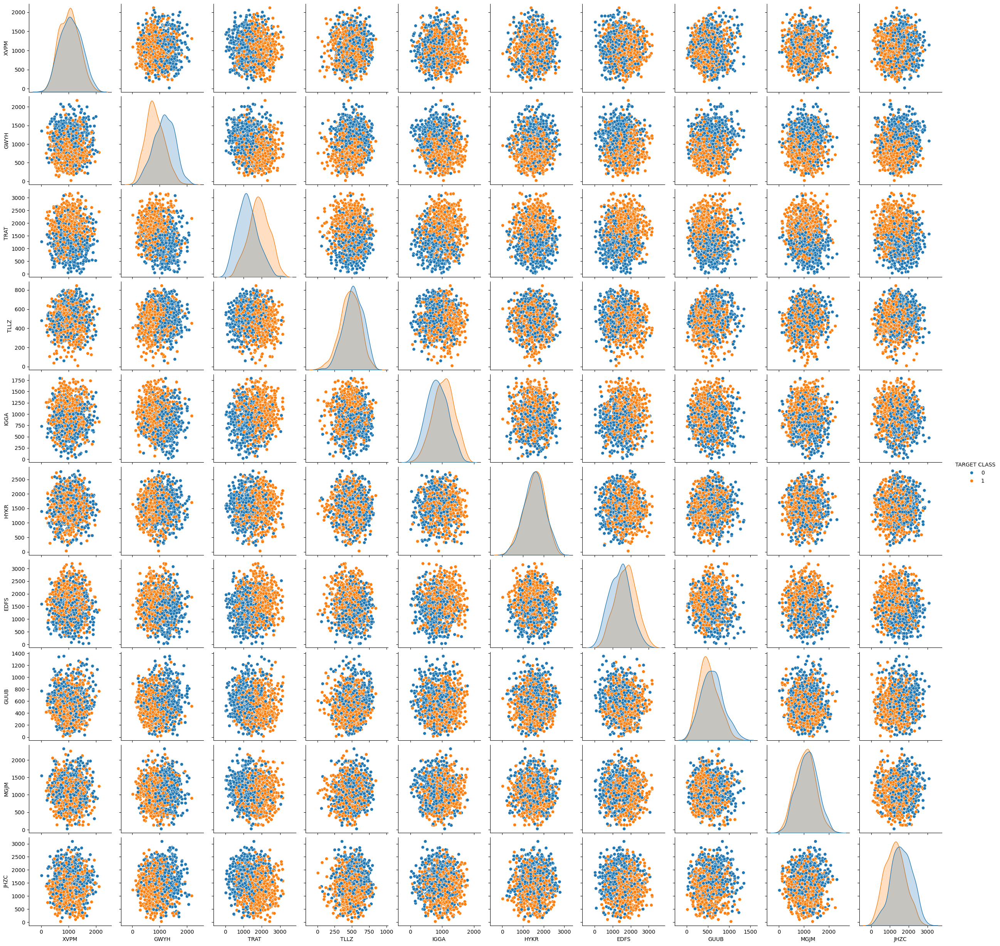

In [41]:
plt.show()

In [42]:
from sklearn.preprocessing import StandardScaler

In [43]:
scaler= StandardScaler()

In [44]:
scaler.fit(df.drop(['TARGET CLASS'],axis=1))

StandardScaler()

In [45]:
scaled_features = scaler.transform(df.drop(['TARGET CLASS'],axis=1))

In [47]:
df_feat =pd.DataFrame(scaled_features,columns = df.columns[:-1])

In [48]:
df_feat

,XVPM,GWYH,TRAT,TLLZ,IGGA,HYKR,EDFS,GUUB,MGJM,JHZC
0,1.568522,-0.443435,1.619808,-0.958255,-1.128481,0.138336,0.980493,-0.932794,1.008313,-1.069627
1,-0.112376,-1.056574,1.741918,-1.504220,0.640009,1.081552,-1.182663,-0.461864,0.258321,-1.041546
2,0.660647,-0.436981,0.775793,0.213394,-0.053171,2.030872,-1.240707,1.149298,2.184784,0.342811
3,0.011533,0.191324,-1.433473,-0.100053,-1.507223,-1.753632,-1.183561,-0.888557,0.162310,-0.002793
4,-0.099059,0.820815,-0.904346,1.609015,-0.282065,-0.365099,-1.095644,0.391419,-1.365603,0.787762
...,...,...,...,...,...,...,...,...,...,...
995,0.776682,0.758234,-1.753322,0.507699,0.174588,-1.279354,-1.797957,0.431419,0.088717,1.188886
996,-0.313446,0.385206,0.885502,-0.083136,-1.208486,0.309242,0.746346,-0.112571,-1.763636,-1.559081
997,-0.358895,-0.979015,0.837715,0.014018,-1.397424,0.054473,0.164120,-1.514726,-0.275122,0.864287
998,0.275080,-0.992399,0.030371,1.062954,1.142871,-0.192872,2.051386,-0.036233,0.436685,-0.212456


In [49]:
from sklearn.model_selection import train_test_split

In [50]:
X = df_feat
y=df['TARGET CLASS']
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=43)

In [51]:
from sklearn.neighbors import KNeighborsClassifier

In [52]:
knn = KNeighborsClassifier(n_neighbors=1)

In [53]:
knn.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=1)

In [54]:
pred = knn.predict(X_test)

In [55]:
from sklearn.metrics import classification_report,confusion_matrix

In [56]:
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

[[65 32]
 [23 80]]
              precision    recall  f1-score   support

           0       0.74      0.67      0.70        97
           1       0.71      0.78      0.74       103

    accuracy                           0.72       200
   macro avg       0.73      0.72      0.72       200
weighted avg       0.73      0.72      0.72       200



In [67]:
error_rate =[]
for i in range(1,40):
    knn =KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train,y_train)
    pred_i2 = knn.predict(X_test)
    error_rate.append(np.mean(pred_i2!=y_test))

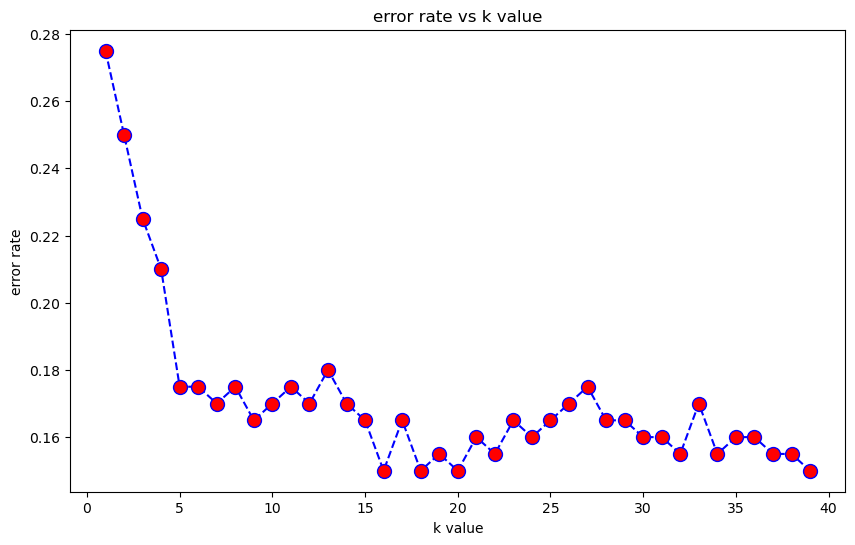

In [68]:
plt.figure(figsize=(10,6))
plt.plot(range(1,40),error_rate,color = 'blue',linestyle ='dashed',marker='o',markerfacecolor = 'red',markersize='10')
plt.xlabel('k value')
plt.ylabel('error rate')
plt.title('error rate vs k value')
plt.show()

# Retrain the model with best kvalue

In [72]:
n_neighbors=40
knn = KNeighborsClassifier(n_neighbors)
knn.fit(X_train,y_train)
pred = knn.predict(X_test)

In [73]:
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

[[81 16]
 [16 87]]
              precision    recall  f1-score   support

           0       0.84      0.84      0.84        97
           1       0.84      0.84      0.84       103

    accuracy                           0.84       200
   macro avg       0.84      0.84      0.84       200
weighted avg       0.84      0.84      0.84       200



# Random forest

In [76]:
import pandas as pd
import numpy as np
from sklearn.datasets import load_digits
digits = load_digits()

In [77]:
dir(digits)

['DESCR', 'data', 'feature_names', 'frame', 'images', 'target', 'target_names']

In [79]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.gray()
for i in range(4):
    plt.matshow(digits.images[i])

<Figure size 640x480 with 0 Axes>

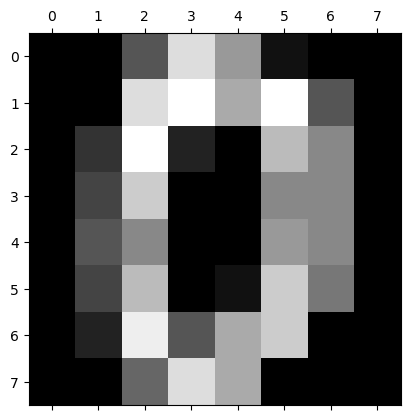

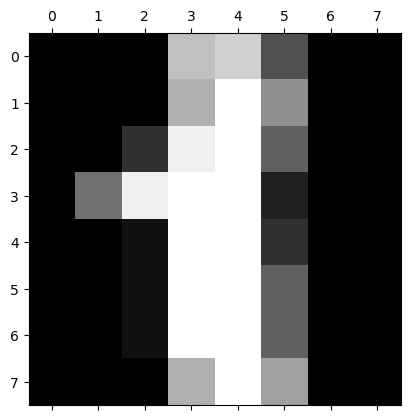

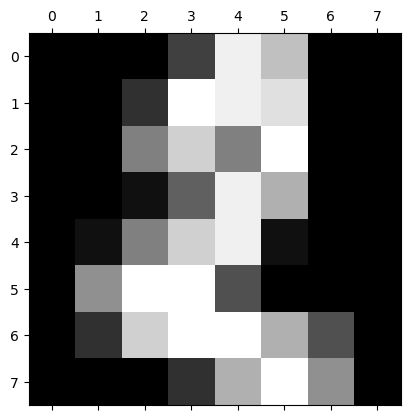

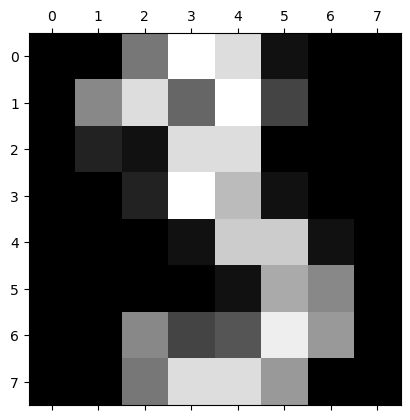

In [80]:
plt.show()

In [99]:
df = pd.DataFrame(digits.data)

In [100]:
df.head()

,0,1,2,3,4,5,6,7,8,9,...,54,55,56,57,58,59,60,61,62,63
0,0.0,0.0,5.0,13.0,9.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,6.0,13.0,10.0,0.0,0.0,0.0
1,0.0,0.0,0.0,12.0,13.0,5.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,11.0,16.0,10.0,0.0,0.0
2,0.0,0.0,0.0,4.0,15.0,12.0,0.0,0.0,0.0,0.0,...,5.0,0.0,0.0,0.0,0.0,3.0,11.0,16.0,9.0,0.0
3,0.0,0.0,7.0,15.0,13.0,1.0,0.0,0.0,0.0,8.0,...,9.0,0.0,0.0,0.0,7.0,13.0,13.0,9.0,0.0,0.0
4,0.0,0.0,0.0,1.0,11.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2.0,16.0,4.0,0.0,0.0


In [101]:
digits.target  # target variable  has mapped to vectors of images

array([0, 1, 2, ..., 8, 9, 8])

In [102]:
df ['target']=digits.target

In [103]:
# df['target']

In [104]:
df.head()

,0,1,2,3,4,5,6,7,8,9,...,55,56,57,58,59,60,61,62,63,target
0,0.0,0.0,5.0,13.0,9.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,6.0,13.0,10.0,0.0,0.0,0.0,0
1,0.0,0.0,0.0,12.0,13.0,5.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,11.0,16.0,10.0,0.0,0.0,1
2,0.0,0.0,0.0,4.0,15.0,12.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,3.0,11.0,16.0,9.0,0.0,2
3,0.0,0.0,7.0,15.0,13.0,1.0,0.0,0.0,0.0,8.0,...,0.0,0.0,0.0,7.0,13.0,13.0,9.0,0.0,0.0,3
4,0.0,0.0,0.0,1.0,11.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,2.0,16.0,4.0,0.0,0.0,4


In [105]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(df.drop(['target'],axis='columns'),digits.target,test_size = 0.2)

In [106]:
len(X_train)

1437

In [110]:
from sklearn.ensemble import RandomForestClassifier

In [112]:
model = RandomForestClassifier()
model.fit(X_train,y_train)

RandomForestClassifier()

In [122]:
model.score(X_test,y_test)

0.9777777777777777

In [123]:
from sklearn.metrics import confusion_matrix

In [127]:
# (confusion_matrix(y_predicted,y_test))

# Decision tree and ranom forest models on preicting the kyphosis disease

In [201]:
df = pd.read_csv(r"C:\Users\konde\Downloads\Py-DS-ML-Bootcamp-master\Refactored_Py_DS_ML_Bootcamp-master\15-Decision-Trees-and-Random-Forests\kyphosis.csv")

In [202]:
df

,Kyphosis,Age,Number,Start
0,absent,71,3,5
1,absent,158,3,14
2,present,128,4,5
3,absent,2,5,1
4,absent,1,4,15
...,...,...,...,...
76,present,157,3,13
77,absent,26,7,13
78,absent,120,2,13
79,present,42,7,6


In [203]:
sns.pairplot(df,hue='Kyphosis')

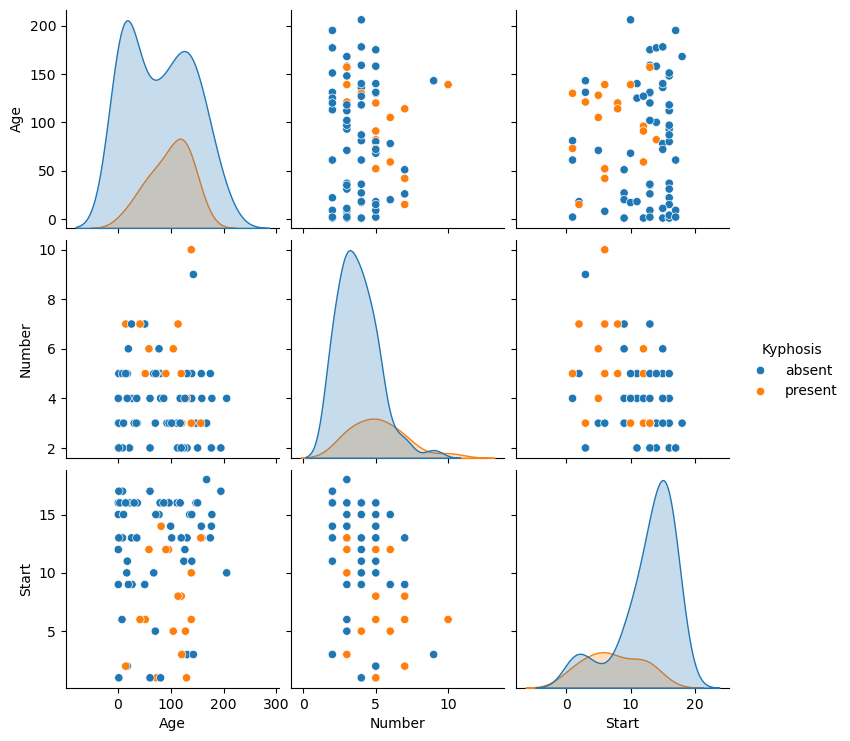

In [204]:
plt.show()

In [205]:
from sklearn.model_selection import train_test_split

In [206]:
X=df.drop(['Kyphosis'],axis=1)
y = df['Kyphosis']

In [207]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2)

In [208]:
from sklearn.tree import DecisionTreeClassifier

In [222]:
dtree = DecisionTreeClassifier()
dtree.fit(X_train,y_train)

DecisionTreeClassifier()

In [223]:
predictions = dtree.predict(X_test)

In [224]:
from sklearn.metrics import classification_report,confusion_matrix

In [225]:
print(confusion_matrix(y_test,predictions))
print('\n')
print(classification_report(y_test,predictions))

[[11  3]
 [ 2  1]]


              precision    recall  f1-score   support

           0       0.85      0.79      0.81        14
           1       0.25      0.33      0.29         3

    accuracy                           0.71        17
   macro avg       0.55      0.56      0.55        17
weighted avg       0.74      0.71      0.72        17



In [226]:
from sklearn.ensemble import RandomForestClassifier

In [227]:
rfc = RandomForestClassifier(n_estimators=10)

In [228]:
rfc.fit(X_train,y_train)

RandomForestClassifier(n_estimators=10)

In [229]:
rfc_pred = rfc.predict(X_test)

In [230]:
print(confusion_matrix(y_test,rfc_pred))
print('\n')
print(classification_report(y_test,rfc_pred))

# Accuracy Score
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

[[13  1]
 [ 3  0]]


              precision    recall  f1-score   support

           0       0.81      0.93      0.87        14
           1       0.00      0.00      0.00         3

    accuracy                           0.76        17
   macro avg       0.41      0.46      0.43        17
weighted avg       0.67      0.76      0.71        17

Accuracy: 0.82


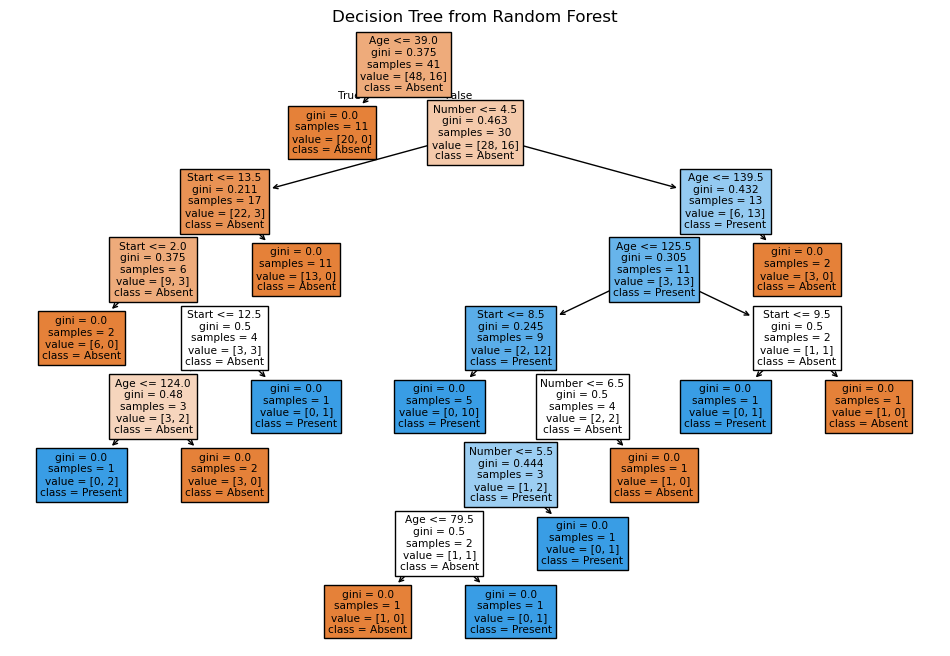

In [231]:
from sklearn.tree import plot_tree
# Visualize the decision tree
plt.figure(figsize=(12, 8))
plot_tree(tree, feature_names=X.columns, class_names=["Absent", "Present"], filled=True)
plt.title("Decision Tree from Random Forest")
plt.show()


In [233]:
# import pandas as pd
# import numpy as np
# import matplotlib.pyplot as plt
# import seaborn as sns
# from sklearn.model_selection import train_test_split
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# # Load Kyphosis Dataset
# # data = pd.read_csv("kyphosis.csv")  # Update with correct file path if needed
# # Check for missing values
# print(df.isnull().sum())

# # Convert categorical target variable to numerical (Label Encoding)
# df['Kyphosis'] = df['Kyphosis'].map({'absent': 0, 'present': 1})

# # Split into features (X) and target (y)
# X = df.drop("Kyphosis", axis=1)
# y = df["Kyphosis"]

# # Split into training and testing sets (80% train, 20% test)
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# # Initialize RandomForestClassifier
# rf = RandomForestClassifier(n_estimators=100, random_state=42)

# # Train the model
# rf.fit(X_train, y_train)
# # Predictions
# y_pred = rf.predict(X_test)

# # Accuracy Score
# accuracy = accuracy_score(y_test, y_pred)
# print(f"Accuracy: {accuracy:.2f}")

# # Classification Report
# print("Classification Report:\n", classification_report(y_test, y_pred))

# # Confusion Matrix
# cm = confusion_matrix(y_test, y_pred)

# # Visualize Confusion Matrix
# plt.figure(figsize=(5,5))
# sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Absent", "Present"], yticklabels=["Absent", "Present"])
# plt.xlabel("Predicted Label")
# plt.ylabel("True Label")
# plt.title("Confusion Matrix")
# plt.show()



In [234]:
# from sklearn.tree import plot_tree
# tree = rf.estimators_[0]  # Get the first tree

# # Visualize the decision tree
# plt.figure(figsize=(12, 8))
# plot_tree(tree, feature_names=X.columns, class_names=["Absent", "Present"], filled=True)
# plt.title("Decision Tree from Random Forest")
# plt.show()

# Decision tree and randomforest models to predict the lending club loan status

In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
loans = pd.read_csv(r"C:\Users\konde\Downloads\Py-DS-ML-Bootcamp-master\Refactored_Py_DS_ML_Bootcamp-master\15-Decision-Trees-and-Random-Forests\loan_data.csv")

In [3]:
loans

,credit.policy,purpose,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid
0,1,debt_consolidation,0.1189,829.10,11.350407,19.48,737,5639.958333,28854,52.1,0,0,0,0
1,1,credit_card,0.1071,228.22,11.082143,14.29,707,2760.000000,33623,76.7,0,0,0,0
2,1,debt_consolidation,0.1357,366.86,10.373491,11.63,682,4710.000000,3511,25.6,1,0,0,0
3,1,debt_consolidation,0.1008,162.34,11.350407,8.10,712,2699.958333,33667,73.2,1,0,0,0
4,1,credit_card,0.1426,102.92,11.299732,14.97,667,4066.000000,4740,39.5,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9573,0,all_other,0.1461,344.76,12.180755,10.39,672,10474.000000,215372,82.1,2,0,0,1
9574,0,all_other,0.1253,257.70,11.141862,0.21,722,4380.000000,184,1.1,5,0,0,1
9575,0,debt_consolidation,0.1071,97.81,10.596635,13.09,687,3450.041667,10036,82.9,8,0,0,1
9576,0,home_improvement,0.1600,351.58,10.819778,19.18,692,1800.000000,0,3.2,5,0,0,1


In [4]:
loans.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9578 entries, 0 to 9577
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   credit.policy      9578 non-null   int64  
 1   purpose            9578 non-null   object 
 2   int.rate           9578 non-null   float64
 3   installment        9578 non-null   float64
 4   log.annual.inc     9578 non-null   float64
 5   dti                9578 non-null   float64
 6   fico               9578 non-null   int64  
 7   days.with.cr.line  9578 non-null   float64
 8   revol.bal          9578 non-null   int64  
 9   revol.util         9578 non-null   float64
 10  inq.last.6mths     9578 non-null   int64  
 11  delinq.2yrs        9578 non-null   int64  
 12  pub.rec            9578 non-null   int64  
 13  not.fully.paid     9578 non-null   int64  
dtypes: float64(6), int64(7), object(1)
memory usage: 1.0+ MB


In [5]:
loans.describe()

,credit.policy,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid
count,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000,9.578000e+03,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000
mean,0.804970,0.122640,319.089413,10.932117,12.606679,710.846314,4560.767197,1.691396e+04,46.799236,1.577469,0.163708,0.062122,0.160054
std,0.396245,0.026847,207.071301,0.614813,6.883970,37.970537,2496.930377,3.375619e+04,29.014417,2.200245,0.546215,0.262126,0.366676
min,0.000000,0.060000,15.670000,7.547502,0.000000,612.000000,178.958333,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,0.103900,163.770000,10.558414,7.212500,682.000000,2820.000000,3.187000e+03,22.600000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.122100,268.950000,10.928884,12.665000,707.000000,4139.958333,8.596000e+03,46.300000,1.000000,0.000000,0.000000,0.000000
75%,1.000000,0.140700,432.762500,11.291293,17.950000,737.000000,5730.000000,1.824950e+04,70.900000,2.000000,0.000000,0.000000,0.000000
max,1.000000,0.216400,940.140000,14.528354,29.960000,827.000000,17639.958330,1.207359e+06,119.000000,33.000000,13.000000,5.000000,1.000000


In [6]:
loans[loans['credit.policy']==1]['fico'].hist(bins=35,color='blue',label='credit policy=1',alpha=0.6)
loans[loans['credit.policy']==0]['fico'].hist(bins=35,color='red',label='credit policy=0',alpha=0.6)
plt.legend()
plt.xlabel('FICO')


Text(0.5, 0, 'FICO')

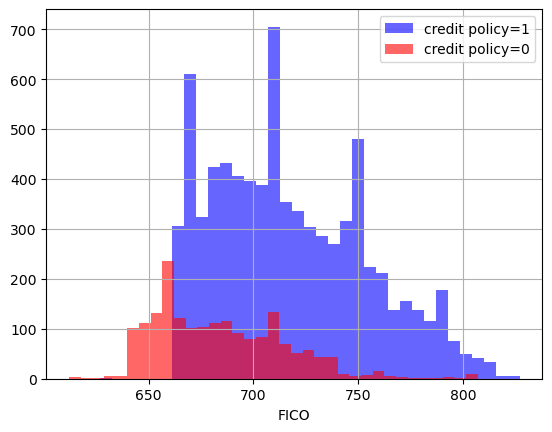

In [7]:
plt.show()

In [8]:
loans[loans['not.fully.paid']==1]['fico'].hist(bins=35,color='blue',label='not.fully.paid=1',alpha=0.6)
loans[loans['not.fully.paid']==0]['fico'].hist(bins=35,color='red',label='not.fully.paid=0',alpha=0.6)
plt.legend()
plt.xlabel('FICO')


Text(0.5, 0, 'FICO')

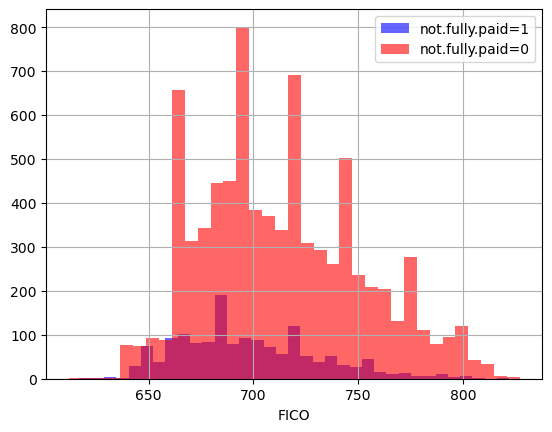

In [9]:
plt.show()

In [10]:
plt.figure(figsize=(11,7))
sns.countplot(x='purpose',data=loans,hue ='not.fully.paid',palette = 'Set1')

<Axes: xlabel='purpose', ylabel='count'>

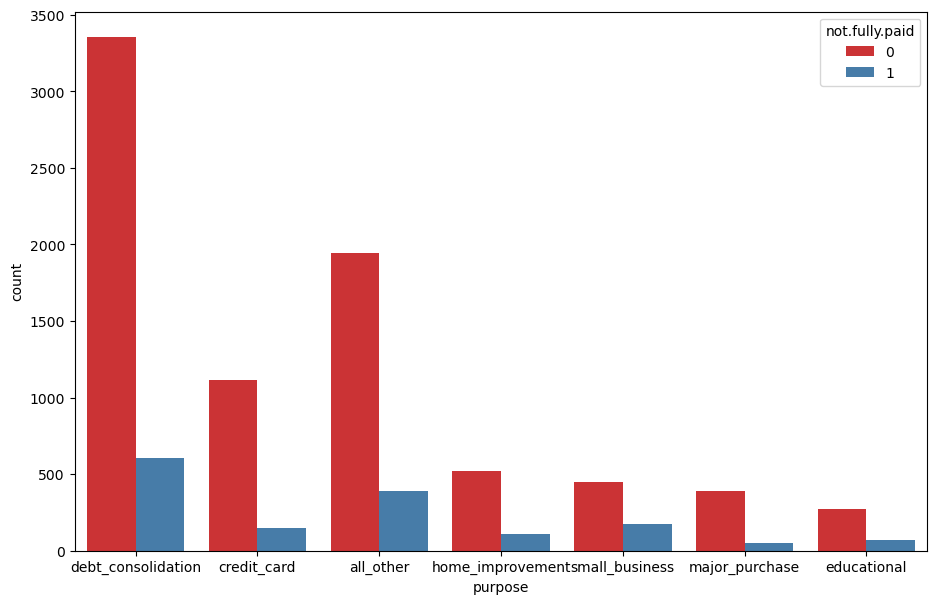

In [11]:
plt.show()

In [12]:
sns.jointplot(x='fico',y='int.rate',data=loans)

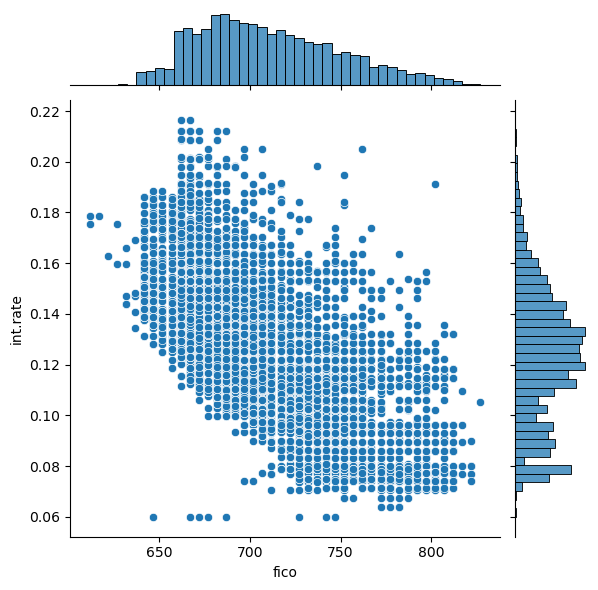

In [13]:
plt.show()

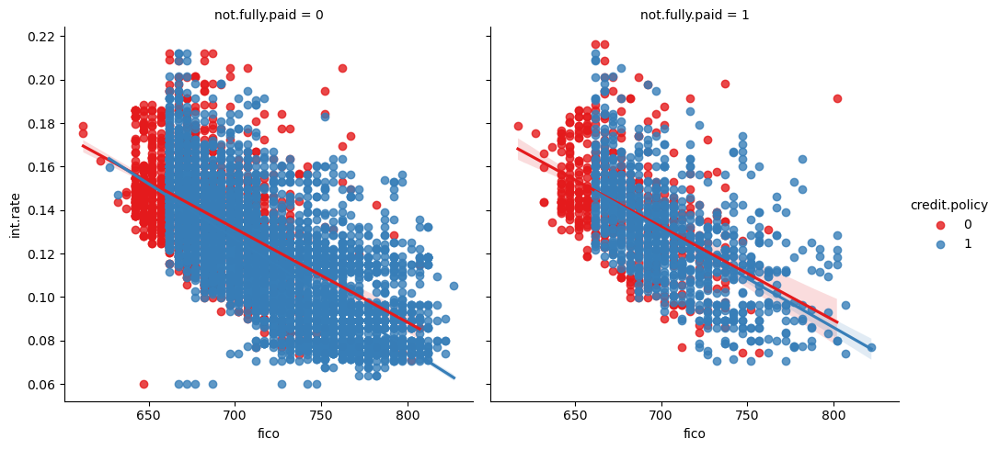

In [14]:
sns.lmplot(x='fico',y='int.rate',data=loans,hue='credit.policy',col='not.fully.paid',palette='Set1')
plt.show()

In [16]:
loans

,credit.policy,purpose,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid
0,1,debt_consolidation,0.1189,829.10,11.350407,19.48,737,5639.958333,28854,52.1,0,0,0,0
1,1,credit_card,0.1071,228.22,11.082143,14.29,707,2760.000000,33623,76.7,0,0,0,0
2,1,debt_consolidation,0.1357,366.86,10.373491,11.63,682,4710.000000,3511,25.6,1,0,0,0
3,1,debt_consolidation,0.1008,162.34,11.350407,8.10,712,2699.958333,33667,73.2,1,0,0,0
4,1,credit_card,0.1426,102.92,11.299732,14.97,667,4066.000000,4740,39.5,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9573,0,all_other,0.1461,344.76,12.180755,10.39,672,10474.000000,215372,82.1,2,0,0,1
9574,0,all_other,0.1253,257.70,11.141862,0.21,722,4380.000000,184,1.1,5,0,0,1
9575,0,debt_consolidation,0.1071,97.81,10.596635,13.09,687,3450.041667,10036,82.9,8,0,0,1
9576,0,home_improvement,0.1600,351.58,10.819778,19.18,692,1800.000000,0,3.2,5,0,0,1


In [17]:
cat_feats=['purpose']

In [21]:
final_data=pd.get_dummies(loans,columns=cat_feats,drop_first=True)

In [37]:
# final_data

In [39]:
from sklearn.model_selection import train_test_split

In [40]:
X=final_data.drop(['not.fully.paid'],axis=1)
y = final_data['not.fully.paid']
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.3,random_state=45)

In [41]:
from sklearn.tree import DecisionTreeClassifier

In [43]:
dtree = DecisionTreeClassifier()
dtree.fit(X_train,y_train)

DecisionTreeClassifier()

In [44]:
predictions = dtree.predict(X_test)

In [46]:
from sklearn.metrics import confusion_matrix,classification_report

In [48]:
print(classification_report(y_test,predictions))
print('\n')
print(confusion_matrix(y_test,predictions))

              precision    recall  f1-score   support

           0       0.85      0.84      0.84      2406
           1       0.22      0.23      0.23       468

    accuracy                           0.74      2874
   macro avg       0.54      0.54      0.54      2874
weighted avg       0.75      0.74      0.74      2874



[[2022  384]
 [ 359  109]]


# Training for RandomForest Model

In [50]:
from sklearn.ensemble import RandomForestClassifier

In [53]:
rfc=RandomForestClassifier(n_estimators=300)

In [54]:
rfc.fit(X_train,y_train)

RandomForestClassifier(n_estimators=300)

In [55]:
predictions = rfc.predict(X_test)

In [56]:
print(classification_report(y_test,predictions))
print('\n')
print(confusion_matrix(y_test,predictions))

              precision    recall  f1-score   support

           0       0.84      1.00      0.91      2406
           1       0.52      0.03      0.05       468

    accuracy                           0.84      2874
   macro avg       0.68      0.51      0.48      2874
weighted avg       0.79      0.84      0.77      2874



[[2395   11]
 [ 456   12]]


In [57]:
import pandas as pd
import numpy as np

In [58]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [61]:
from sklearn.datasets import load_breast_cancer

In [62]:
cancer = load_breast_cancer()

In [64]:
cancer.keys()

dict_keys(['data', 'target', 'frame', 'target_names', 'DESCR', 'feature_names', 'filename', 'data_module'])

In [65]:
print(cancer['DESCR'])

.. _breast_cancer_dataset:

Breast cancer wisconsin (diagnostic) dataset
--------------------------------------------

**Data Set Characteristics:**

:Number of Instances: 569

:Number of Attributes: 30 numeric, predictive attributes and the class

:Attribute Information:
    - radius (mean of distances from center to points on the perimeter)
    - texture (standard deviation of gray-scale values)
    - perimeter
    - area
    - smoothness (local variation in radius lengths)
    - compactness (perimeter^2 / area - 1.0)
    - concavity (severity of concave portions of the contour)
    - concave points (number of concave portions of the contour)
    - symmetry
    - fractal dimension ("coastline approximation" - 1)

    The mean, standard error, and "worst" or largest (mean of the three
    worst/largest values) of these features were computed for each image,
    resulting in 30 features.  For instance, field 0 is Mean Radius, field
    10 is Radius SE, field 20 is Worst Radius.

    - 

In [66]:
df = pd.DataFrame(cancer['data'],columns = cancer['feature_names'])

In [67]:
df

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [68]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 30 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   mean radius              569 non-null    float64
 1   mean texture             569 non-null    float64
 2   mean perimeter           569 non-null    float64
 3   mean area                569 non-null    float64
 4   mean smoothness          569 non-null    float64
 5   mean compactness         569 non-null    float64
 6   mean concavity           569 non-null    float64
 7   mean concave points      569 non-null    float64
 8   mean symmetry            569 non-null    float64
 9   mean fractal dimension   569 non-null    float64
 10  radius error             569 non-null    float64
 11  texture error            569 non-null    float64
 12  perimeter error          569 non-null    float64
 13  area error               569 non-null    float64
 14  smoothness error         5

In [71]:
cancer['target']

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0,
       1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0,
       1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0,
       0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1,
       1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0,
       0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0,
       1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0,

In [70]:
from sklearn.model_selection import train_test_split

In [74]:
X = df
y = cancer['target']
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=43)

In [75]:
from sklearn.svm import SVC

In [78]:
model =SVC()
model.fit(X_train,y_train)

SVC()

In [79]:
predictions = model.predict(X_test)

In [80]:
from sklearn.metrics import classification_report,confusion_matrix

In [82]:
print(confusion_matrix(y_test,predictions))
print('\n')
print(classification_report(y_test,predictions))

[[34  5]
 [ 0 75]]


              precision    recall  f1-score   support

           0       1.00      0.87      0.93        39
           1       0.94      1.00      0.97        75

    accuracy                           0.96       114
   macro avg       0.97      0.94      0.95       114
weighted avg       0.96      0.96      0.96       114



In [85]:
# from sklearn.grid_search import GridSearchCV
from sklearn.model_selection import GridSearchCV


In [86]:
param_grid = {'C':[0.1,1,10,100,1000],'gamma':[1,0.1,0.01,0.001,0.0001]}

In [87]:
grid = GridSearchCV(SVC(),param_grid,verbose=3)

In [88]:
grid.fit(X_train,y_train)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END ....................C=0.1, gamma=1;, score=0.626 total time=   0.0s
[CV 2/5] END ....................C=0.1, gamma=1;, score=0.626 total time=   0.0s
[CV 3/5] END ....................C=0.1, gamma=1;, score=0.615 total time=   0.0s
[CV 4/5] END ....................C=0.1, gamma=1;, score=0.615 total time=   0.0s
[CV 5/5] END ....................C=0.1, gamma=1;, score=0.615 total time=   0.0s
[CV 1/5] END ..................C=0.1, gamma=0.1;, score=0.626 total time=   0.0s
[CV 2/5] END ..................C=0.1, gamma=0.1;, score=0.626 total time=   0.0s
[CV 3/5] END ..................C=0.1, gamma=0.1;, score=0.615 total time=   0.0s
[CV 4/5] END ..................C=0.1, gamma=0.1;, score=0.615 total time=   0.0s
[CV 5/5] END ..................C=0.1, gamma=0.1;, score=0.615 total time=   0.0s
[CV 1/5] END .................C=0.1, gamma=0.01;, score=0.626 total time=   0.0s
[CV 2/5] END .................C=0.1, gamma=0.01

GridSearchCV(estimator=SVC(),
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001]},
             verbose=3)

In [90]:
grid.best_params_

{'C': 100, 'gamma': 0.0001}

In [91]:
grid.best_estimator_

SVC(C=100, gamma=0.0001)

In [92]:
grid_predictions = grid.predict(X_test)

In [93]:
print(confusion_matrix(y_test,predictions))
print('\n')
print(classification_report(y_test,predictions))

[[34  5]
 [ 0 75]]


              precision    recall  f1-score   support

           0       1.00      0.87      0.93        39
           1       0.94      1.00      0.97        75

    accuracy                           0.96       114
   macro avg       0.97      0.94      0.95       114
weighted avg       0.96      0.96      0.96       114



In [32]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [33]:
import seaborn as sns

# Load the dataset as a DataFrame
df = sns.load_dataset("iris")

# Display the first 5 rows
df.head()


,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa


In [35]:
sns.pairplot(hue='species',data=df)

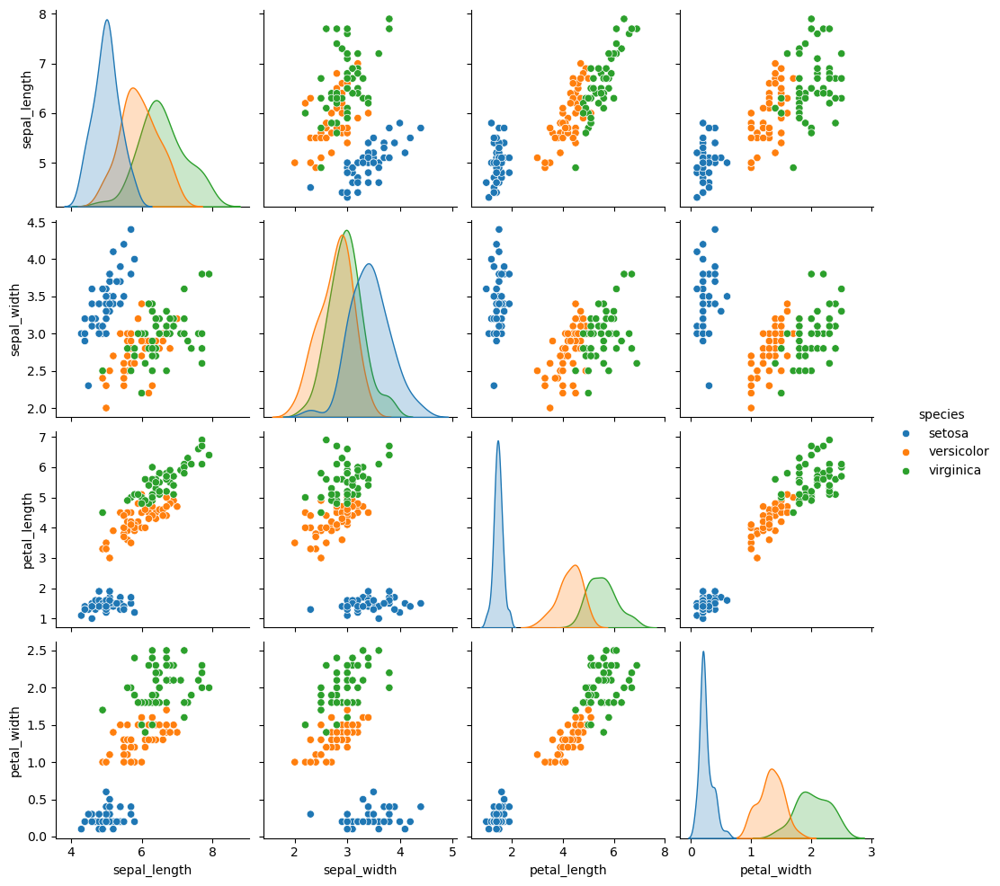

In [36]:
plt.show()

In [41]:
setosa = df[df['species']=='setosa']
sns.kdeplot(x=setosa['sepal_width'],y=setosa['sepal_length'],cmap='plasma',fill=True)

<Axes: xlabel='sepal_width', ylabel='sepal_length'>

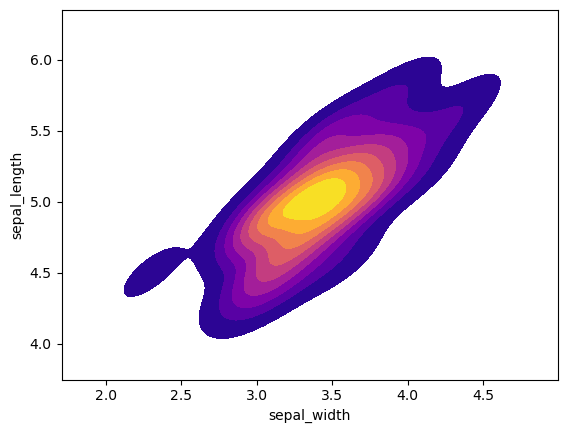

In [40]:
plt.show()

In [43]:
from sklearn.model_selection import train_test_split

In [65]:
X=df.drop(['species'],axis=1)
y=df['species']
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.3,random_state=42)

In [66]:
from sklearn.svm import SVC

In [67]:
svc_model = SVC()
svc_model.fit(X_train,y_train)

SVC()

In [68]:
predctions = svc_model.predict(X_test)

In [69]:
from sklearn.metrics import classification_report,confusion_matrix

In [70]:
print(confusion_matrix(y_test,predctions))
print('\n')
print(classification_report(y_test,predctions))

[[19  0  0]
 [ 0 13  0]
 [ 0  0 13]]


              precision    recall  f1-score   support

      setosa       1.00      1.00      1.00        19
  versicolor       1.00      1.00      1.00        13
   virginica       1.00      1.00      1.00        13

    accuracy                           1.00        45
   macro avg       1.00      1.00      1.00        45
weighted avg       1.00      1.00      1.00        45



In [73]:
# from sklearn.grid_search import GridSearchCV
from sklearn.model_selection import GridSearchCV

In [75]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split

# Load dataset
iris = load_iris()
X_train, X_test, y_train, y_test = train_test_split(iris.data, iris.target, test_size=0.2, random_state=42)

# Define model
svm_model = SVC()

# Define hyperparameter grid
param_grid = {
    'C': [0.1, 1, 10],           # Regularization parameter
    'kernel': ['linear', 'rbf'],  # Type of kernel
    'gamma': [0.01, 0.1, 1]       # Kernel coefficient (only for 'rbf')
}

# Apply GridSearchCV
grid_search = GridSearchCV(svm_model, param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train, y_train)

grid_predictions= grid_search.predict(X_test)

# Get the best parameters and best model
print("Best Parameters:", grid_search.best_params_)
print("Best Score:", grid_search.best_score_)

# Evaluate on test data
best_model = grid_search.best_estimator_
test_accuracy = best_model.score(X_test, y_test)
print("Test Accuracy:", test_accuracy)



Best Parameters: {'C': 1, 'gamma': 0.01, 'kernel': 'linear'}
Best Score: 0.9583333333333334
Test Accuracy: 1.0


In [76]:
print(confusion_matrix(y_test,grid_predictions))
print('\n')
print(classification_report(y_test,grid_predictions))

[[10  0  0]
 [ 0  9  0]
 [ 0  0 11]]


              precision    recall  f1-score   support

           0       1.00      1.00      1.00        10
           1       1.00      1.00      1.00         9
           2       1.00      1.00      1.00        11

    accuracy                           1.00        30
   macro avg       1.00      1.00      1.00        30
weighted avg       1.00      1.00      1.00        30



# K-Means clustering

In [187]:
import seaborn as sns
import matplotlib.pyplot as plt

In [188]:
from sklearn.datasets import make_blobs

In [189]:
data= make_blobs(n_samples=200,n_features=2,centers=4,cluster_std=1.8,random_state=42)

In [211]:
# data[0]

In [191]:
data[1]

array([1, 0, 3, 3, 2, 2, 1, 3, 1, 2, 2, 1, 1, 2, 2, 2, 0, 3, 2, 2, 2, 2,
       3, 0, 3, 0, 0, 2, 0, 1, 2, 2, 3, 3, 0, 1, 3, 1, 3, 0, 2, 0, 2, 2,
       3, 1, 1, 2, 1, 0, 3, 0, 3, 1, 0, 0, 2, 2, 0, 1, 3, 1, 2, 3, 3, 2,
       1, 0, 3, 0, 0, 3, 0, 2, 1, 2, 1, 0, 2, 0, 0, 1, 2, 3, 3, 3, 3, 0,
       1, 3, 2, 0, 1, 1, 1, 3, 0, 1, 2, 0, 3, 3, 0, 2, 0, 1, 3, 2, 2, 3,
       1, 2, 0, 3, 0, 3, 3, 0, 0, 0, 3, 2, 1, 3, 3, 1, 0, 1, 1, 0, 2, 2,
       0, 3, 3, 1, 2, 2, 0, 2, 1, 0, 3, 1, 1, 0, 1, 3, 2, 2, 0, 3, 1, 3,
       2, 3, 3, 1, 1, 1, 0, 1, 1, 3, 0, 2, 1, 1, 2, 1, 3, 0, 2, 2, 1, 2,
       1, 0, 0, 2, 0, 2, 3, 3, 3, 0, 1, 1, 1, 0, 0, 2, 3, 3, 0, 3, 1, 0,
       2, 1])

In [192]:
from sklearn.datasets import make_blobs
import matplotlib.pyplot as plt

# Generate the data
data, labels = make_blobs(n_samples=200, n_features=2, centers=4, cluster_std=1.8, random_state=42)

# Plot the data
plt.scatter(data[:, 0], data[:, 1], c=labels, cmap='viridis')


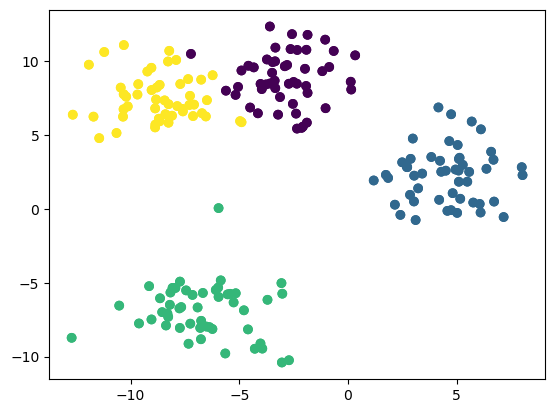

In [193]:
plt.show()

In [203]:
from sklearn.cluster import KMeans

In [239]:
kmeans = KMeans(n_clusters=2)

In [240]:
kmeans.fit(data)

C:\Users\konde\Downloads\naviGATOR\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


KMeans(n_clusters=2)

In [258]:
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Generate the data
data, labels = make_blobs(n_samples=200, n_features=2, centers=5, cluster_std=1.8, random_state=42)

# Fit KMeans
kmeans = KMeans(n_clusters=4)
kmeans.fit(data)  # Pass the full 2D array

# Get cluster centers and labels
centroids = kmeans.cluster_centers_
predicted_labels = kmeans.labels_

# Plot the data
plt.scatter(data[:, 0], data[:, 1], c=predicted_labels, cmap='viridis')
plt.scatter(centroids[:, 0], centroids[:, 1], c='red', marker='X', s=200)  # Plot centroids
plt.title("KMeans Clustering")


C:\Users\konde\Downloads\naviGATOR\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


Text(0.5, 1.0, 'KMeans Clustering')

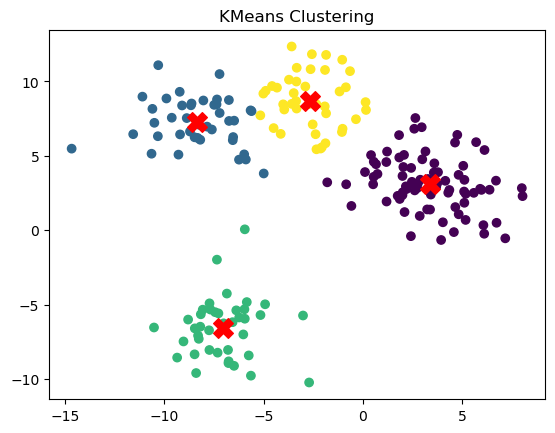

In [259]:
plt.show()

In [264]:
# fig,(ax1,ax2) = plt.subplots(1,2,sharey=True,figsize=(10,6))
# ax1.set_title('K Means')
# ax1.scatter(data[:, 0], data[:, 1], c=labels, cmap='viridis')


# ax2.set_title('Original')
# # ax1.scatter(X,y,c=y,cmap='rainbow')
# ax2.scatter(data[:, 0], data[:, 1], c=predicted_labels, cmap='viridis')

In [266]:
# plt.show()

In [326]:
import numpy as np
import pandas as pd

In [327]:
import seaborn as sns
import matplotlib.pyplot as plt

In [328]:
df = pd.read_csv(r"C:\Users\konde\Downloads\Py-DS-ML-Bootcamp-master\Refactored_Py_DS_ML_Bootcamp-master\17-K-Means-Clustering\College_Data")

In [329]:
df

,Unnamed: 0,Private,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
0,Abilene Christian University,Yes,1660,1232,721,23,52,2885,537,7440,3300,450,2200,70,78,18.1,12,7041,60
1,Adelphi University,Yes,2186,1924,512,16,29,2683,1227,12280,6450,750,1500,29,30,12.2,16,10527,56
2,Adrian College,Yes,1428,1097,336,22,50,1036,99,11250,3750,400,1165,53,66,12.9,30,8735,54
3,Agnes Scott College,Yes,417,349,137,60,89,510,63,12960,5450,450,875,92,97,7.7,37,19016,59
4,Alaska Pacific University,Yes,193,146,55,16,44,249,869,7560,4120,800,1500,76,72,11.9,2,10922,15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
772,Worcester State College,No,2197,1515,543,4,26,3089,2029,6797,3900,500,1200,60,60,21.0,14,4469,40
773,Xavier University,Yes,1959,1805,695,24,47,2849,1107,11520,4960,600,1250,73,75,13.3,31,9189,83
774,Xavier University of Louisiana,Yes,2097,1915,695,34,61,2793,166,6900,4200,617,781,67,75,14.4,20,8323,49
775,Yale University,Yes,10705,2453,1317,95,99,5217,83,19840,6510,630,2115,96,96,5.8,49,40386,99


In [340]:
# import pandas as pd
# import numpy as np
# from sklearn.cluster import KMeans
# from sklearn.preprocessing import StandardScaler
# from sklearn.decomposition import PCA
# import matplotlib.pyplot as plt

# # Load the data (replace 'your_data.csv' with the actual file path)
# # df = pd.read_csv('your_data.csv')

# # Step 1: Preprocess the data
# # Drop the 'Unnamed: 0' column
# # df = df.drop(columns=['Unnamed: 0'])

# # Encode the 'Private' column (Yes -> 1, No -> 0)
# df['Private'] = df['Private'].map({'Yes': 1, 'No': 0})

# # Check for missing values
# print("Missing values:\n", df.isnull().sum())

# # If there are missing values, handle them (e.g., drop rows or fill with mean)
# df = df.dropna()  # Drop rows with missing values

# # Step 2: Scale the data
# scaler = StandardScaler()
# scaled_data = scaler.fit_transform(df)

# # Step 3: Perform K-means clustering
# kmeans = KMeans(n_clusters=2, random_state=42)  # 2 clusters for private and public schools
# kmeans.fit(scaled_data)

# # Add cluster labels to the original dataframe
# df['Cluster'] = kmeans.labels_

# # Step 4: Visualize the clusters using PCA for dimensionality reduction
# pca = PCA(n_components=2)  # Reduce to 2D for visualization
# pca_data = pca.fit_transform(scaled_data)

# # Plot the clusters
# plt.figure(figsize=(10, 6))
# plt.scatter(pca_data[:, 0], pca_data[:, 1], c=df['Cluster'], cmap='viridis', s=50)
# plt.title('K-means Clustering: Private vs Public Schools (2D PCA)')
# plt.xlabel('PCA Component 1')
# plt.ylabel('PCA Component 2')
# plt.colorbar(label='Cluster')
# plt.show()

# # Print cluster centers in the original feature space
# cluster_centers = scaler.inverse_transform(kmeans.cluster_centers_)
# cluster_centers_df = pd.DataFrame(cluster_centers, columns=df.columns[:-1])
# print("Cluster Centers:\n", cluster_centers_df)

# # Compare clusters with the 'Private' column
# print("Cluster Distribution:\n", df['Cluster'].value_counts())
# print("Private School Distribution in Clusters:\n", df.groupby('Cluster')['Private'].value_counts())

In [335]:
# import pandas as pd
# import numpy as np
# import matplotlib.pyplot as plt
# import seaborn as sns
# from sklearn.cluster import KMeans
# from sklearn.preprocessing import StandardScaler, LabelEncoder
# from sklearn.metrics import accuracy_score, confusion_matrix

# # # Load dataset
# # df = pd.read_csv("college_data.csv")  # Update with your file path

# # Step 1: Preprocess Data
# df.drop(columns=["Unnamed: 0"], inplace=True, errors='ignore')  # Drop unnamed index column

# # Convert 'Private' column to numerical values (Yes=1, No=0)
# df['Private'] = df['Private'].map({'Yes': 1, 'No': 0})

# # Standardize numerical features
# scaler = StandardScaler()
# df_scaled = scaler.fit_transform(df.drop(columns=['Private']))  # Exclude 'Private' during scaling

# # Step 2: Apply K-Means
# kmeans = KMeans(n_clusters=2, random_state=42, n_init=10)  # 2 clusters for Private/Public
# df["Cluster"] = kmeans.fit_predict(df_scaled)

# # Step 3: Evaluate the Clustering
# conf_matrix = confusion_matrix(df["Private"], df["Cluster"])
# accuracy = max(np.trace(conf_matrix) / np.sum(conf_matrix), 1 - np.trace(conf_matrix) / np.sum(conf_matrix))

# print("Confusion Matrix:\n", conf_matrix)
# print("\nClustering Accuracy: {:.2f}%".format(accuracy * 100))

# # Step 4: Visualization
# plt.figure(figsize=(10, 6))
# sns.scatterplot(x=df["Outstate"], y=df["F.Undergrad"], hue=df["Cluster"], palette="rainbow", edgecolor="k", alpha=0.7)
# plt.scatter(kmeans.cluster_centers_[:, df.columns.get_loc("Outstate")], 
#             kmeans.cluster_centers_[:, df.columns.get_loc("F.Undergrad")], 
#             s=300, c="black", marker="X", label="Centroids")
# plt.xlabel("Outstate Tuition")
# plt.ylabel("Full-time Undergrad Students")
# plt.title("K-Means Clustering: Private vs Public Colleges")
# plt.legend()
# plt.show()


In [276]:
df.describe()

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
count,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.000000,777.00000
mean,3001.638353,2018.804376,779.972973,27.558559,55.796654,3699.907336,855.298584,10440.669241,4357.526384,549.380952,1340.642214,72.660232,79.702703,14.089704,22.743887,9660.171171,65.46332
std,3870.201484,2451.113971,929.176190,17.640364,19.804778,4850.420531,1522.431887,4023.016484,1096.696416,165.105360,677.071454,16.328155,14.722359,3.958349,12.391801,5221.768440,17.17771
min,81.000000,72.000000,35.000000,1.000000,9.000000,139.000000,1.000000,2340.000000,1780.000000,96.000000,250.000000,8.000000,24.000000,2.500000,0.000000,3186.000000,10.00000
25%,776.000000,604.000000,242.000000,15.000000,41.000000,992.000000,95.000000,7320.000000,3597.000000,470.000000,850.000000,62.000000,71.000000,11.500000,13.000000,6751.000000,53.00000
50%,1558.000000,1110.000000,434.000000,23.000000,54.000000,1707.000000,353.000000,9990.000000,4200.000000,500.000000,1200.000000,75.000000,82.000000,13.600000,21.000000,8377.000000,65.00000
75%,3624.000000,2424.000000,902.000000,35.000000,69.000000,4005.000000,967.000000,12925.000000,5050.000000,600.000000,1700.000000,85.000000,92.000000,16.500000,31.000000,10830.000000,78.00000
max,48094.000000,26330.000000,6392.000000,96.000000,100.000000,31643.000000,21836.000000,21700.000000,8124.000000,2340.000000,6800.000000,103.000000,100.000000,39.800000,64.000000,56233.000000,118.00000


In [280]:
sns.lmplot(x='Room.Board',y='Grad.Rate',data=df,hue='Private',fit_reg=False)

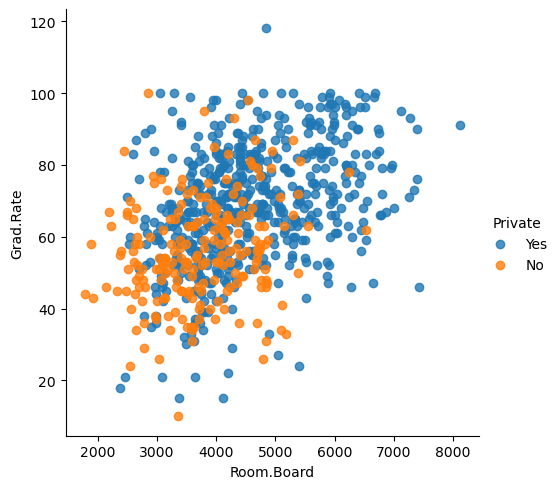

In [281]:
plt.show()

In [282]:
sns.lmplot(x='Outstate',y='F.Undergrad',data=df,hue='Private',fit_reg=False)

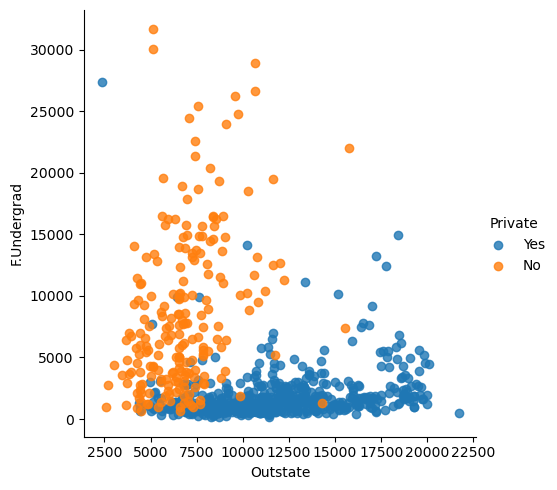

In [283]:
plt.show()

In [295]:
g = sns.FacetGrid(df,hue='Private',aspect=2)
g.map(plt.hist,'Outstate',bins=20)

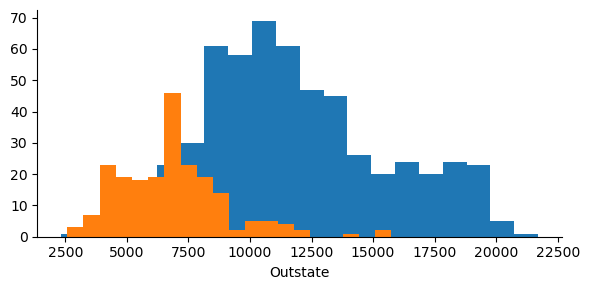

In [296]:
plt.show()

In [297]:
g = sns.FacetGrid(df,hue='Private',aspect=2)
g.map(plt.hist,'Grad.Rate',bins=20)

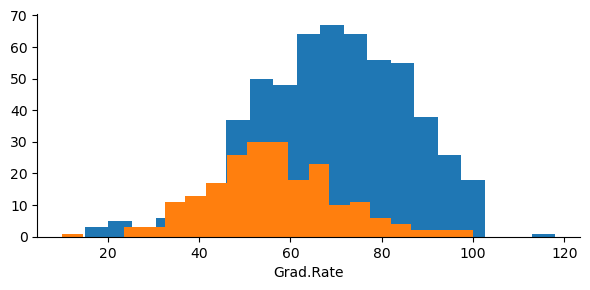

In [298]:
plt.show()

In [299]:
df[df['Grad.Rate']>100]

,Private,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
Cazenovia College,Yes,3847,3433,527,9,35,1010,12,9384,4840,600,500,22,47,14.3,20,7697,118


In [300]:
df['Grad.Rate']['Cazenovia College']=100

C:\Users\konde\AppData\Local\Temp\ipykernel_26024\3480376862.py:1: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df['Grad.Rate']['Cazenovia College']=100
C:\Users\konde\AppData\Local\Temp\ipykernel_26024\3480376862.py:1: SettingWithCopyWarni

In [301]:
df[df['Grad.Rate']>100]

,Private,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate


In [302]:
g = sns.FacetGrid(df,hue='Private',aspect=2)
g.map(plt.hist,'Grad.Rate',bins=20)

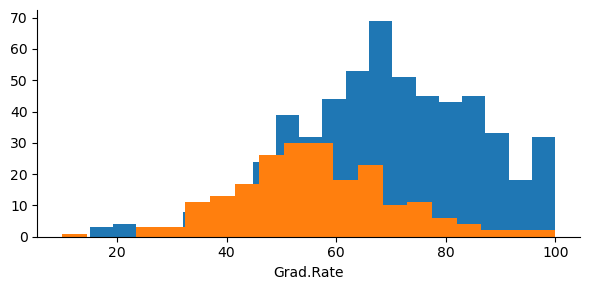

In [303]:
plt.show()

In [304]:
from sklearn.cluster import KMeans

In [305]:
kmeans = KMeans(n_clusters=2)

In [309]:
kmeans.fit(df.drop('Private',axis=1))

C:\Users\konde\Downloads\naviGATOR\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


KMeans(n_clusters=2)

In [310]:
kmeans.cluster_centers_

array([[1.03631389e+04, 6.55089815e+03, 2.56972222e+03, 4.14907407e+01,
        7.02037037e+01, 1.30619352e+04, 2.46486111e+03, 1.07191759e+04,
        4.64347222e+03, 5.95212963e+02, 1.71420370e+03, 8.63981481e+01,
        9.13333333e+01, 1.40277778e+01, 2.00740741e+01, 1.41705000e+04,
        6.75925926e+01],
       [1.81323468e+03, 1.28716592e+03, 4.91044843e+02, 2.53094170e+01,
        5.34708520e+01, 2.18854858e+03, 5.95458894e+02, 1.03957085e+04,
        4.31136472e+03, 5.41982063e+02, 1.28033632e+03, 7.04424514e+01,
        7.78251121e+01, 1.40997010e+01, 2.31748879e+01, 8.93204634e+03,
        6.50926756e+01]])

In [311]:
def converter(private):
    if private ==' Yes':
        return 1
    else:
        return 0

In [312]:
df['Cluster'] =df['Private'].apply(converter)

In [313]:
df.head()

,Private,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate,Cluster
Abilene Christian University,Yes,1660,1232,721,23,52,2885,537,7440,3300,450,2200,70,78,18.1,12,7041,60,0
Adelphi University,Yes,2186,1924,512,16,29,2683,1227,12280,6450,750,1500,29,30,12.2,16,10527,56,0
Adrian College,Yes,1428,1097,336,22,50,1036,99,11250,3750,400,1165,53,66,12.9,30,8735,54,0
Agnes Scott College,Yes,417,349,137,60,89,510,63,12960,5450,450,875,92,97,7.7,37,19016,59,0
Alaska Pacific University,Yes,193,146,55,16,44,249,869,7560,4120,800,1500,76,72,11.9,2,10922,15,0


In [314]:
from sklearn.metrics import confusion_matrix,classification_report

In [342]:
# print(confusion_matrix(df['Cluster'],kmeans.labels_))
# print('\n')
# print(classification_report(df['Cluster'],kmeans.labels_))

In [344]:
# import pandas as pd
# import numpy as np
# import matplotlib.pyplot as plt
# import seaborn as sns
# from sklearn.decomposition import PCA
# from sklearn.preprocessing import StandardScaler
# from sklearn.datasets import load_iris

# # Load the Iris dataset
# iris = load_iris()
# df = pd.DataFrame(iris.data, columns=iris.feature_names)
# df["target"] = iris.target

# # Step 1: Standardize the Data
# scaler = StandardScaler()
# df_scaled = scaler.fit_transform(df.iloc[:, :-1])  # Exclude target column

# # Step 2: Apply PCA (Reduce from 4D to 2D)
# pca = PCA(n_components=2)
# df_pca = pca.fit_transform(df_scaled)

# # Step 3: Convert to DataFrame
# df_pca = pd.DataFrame(df_pca, columns=["PC1", "PC2"])
# df_pca["target"] = df["target"]

# # Step 4: Visualize PCA-transformed Data
# plt.figure(figsize=(8, 6))
# sns.scatterplot(x=df_pca["PC1"], y=df_pca["PC2"], hue=df_pca["target"], palette="viridis", alpha=0.8)
# plt.xlabel("Principal Component 1")
# plt.ylabel("Principal Component 2")
# plt.title("PCA: Iris Dataset (4D → 2D)")
# plt.legend(["Setosa", "Versicolor", "Virginica"])
# plt.show()


# PRINCIPAL COMPONENT ANALYSIS

In [345]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
%matplotlib inline

In [347]:
from sklearn.datasets import load_breast_cancer

In [355]:
cancer = load_breast_cancer()

In [358]:
type(cancer)

sklearn.utils._bunch.Bunch

In [359]:
cancer.keys()

dict_keys(['data', 'target', 'frame', 'target_names', 'DESCR', 'feature_names', 'filename', 'data_module'])

In [361]:
#print(cancer['DESCR'])

In [362]:
df = pd.DataFrame(cancer['data'],columns=cancer['feature_names'])

In [363]:
df

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [365]:
from sklearn.preprocessing import StandardScaler

In [366]:
scaler = StandardScaler()

In [367]:
scaler.fit(df)

StandardScaler()

In [369]:
scaled_data=scaler.transform(df)

In [372]:
from sklearn.decomposition import PCA

In [375]:
pca = PCA(n_components=2)

In [376]:
pca.fit(scaled_data)

PCA(n_components=2)

In [377]:
x_pca = pca.transform(scaled_data)

In [379]:
x_pca.shape

(569, 2)

In [380]:
scaled_data.shape

(569, 30)

In [394]:
plt.figure(figsize=(10,6))
plt.scatter(x_pca[:,0],x_pca[:,1],c=cancer['target'])
plt.xlabel('first pca')
plt.ylabel('second pca')


Text(0, 0.5, 'second pca')

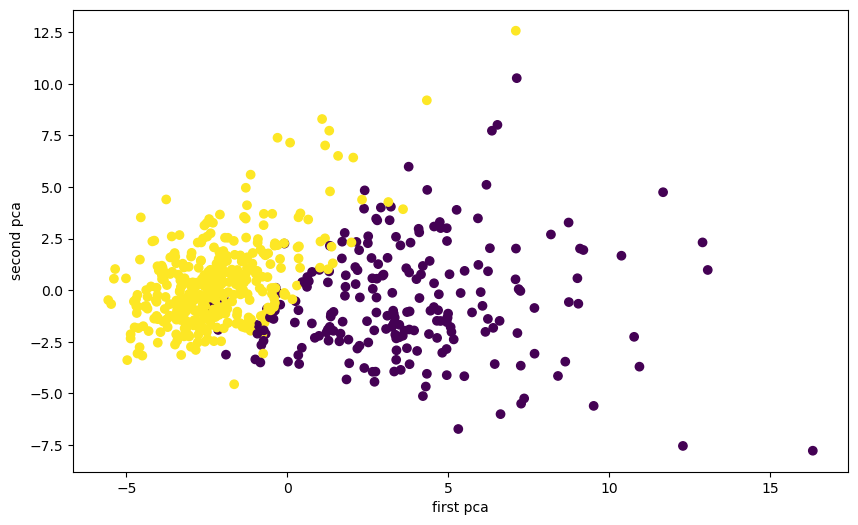

In [395]:
plt.show()

In [396]:
df_comp = pd.DataFrame(pca.components_,columns=cancer['feature_names'])

In [397]:
df_comp

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,0.218902,0.103725,0.227537,0.220995,0.142590,0.239285,0.258400,0.260854,0.138167,0.064363,...,0.227997,0.104469,0.236640,0.224871,0.127953,0.210096,0.228768,0.250886,0.122905,0.131784
1,-0.233857,-0.059706,-0.215181,-0.231077,0.186113,0.151892,0.060165,-0.034768,0.190349,0.366575,...,-0.219866,-0.045467,-0.199878,-0.219352,0.172304,0.143593,0.097964,-0.008257,0.141883,0.275339


In [398]:
sns.heatmap(df_comp,cmap='plasma')

<Axes: >

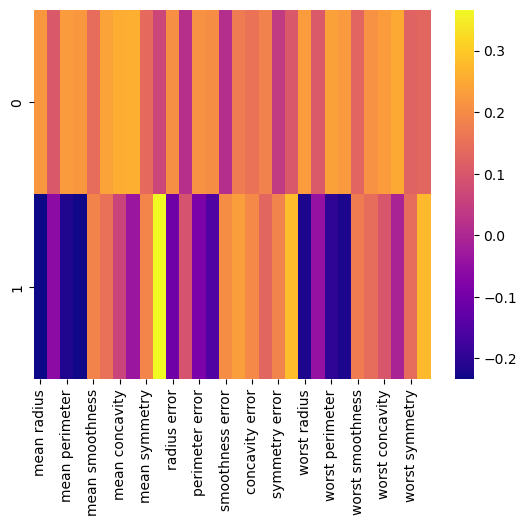

In [399]:
plt.show()

# Recommandation systems

In [79]:
import numpy as np
import pandas as pd

In [80]:
column_names = ['user_id', 'item_id', 'rating', 'timestamp']

In [81]:
df = pd.read_csv(r"C:\Users\konde\Downloads\Py-DS-ML-Bootcamp-master\Refactored_Py_DS_ML_Bootcamp-master\19-Recommender-Systems\u.data", sep='\t', names=column_names)

In [129]:
df.head()

,user_id,item_id,rating,timestamp,title
0,0,50,5,881250949,Star Wars (1977)
1,0,172,5,881250949,"Empire Strikes Back, The (1980)"
2,0,133,1,881250949,Gone with the Wind (1939)
3,196,242,3,881250949,Kolya (1996)
4,186,302,3,891717742,L.A. Confidential (1997)


In [83]:
movie_titles = pd.read_csv(r"C:\Users\konde\Downloads\Py-DS-ML-Bootcamp-master\Refactored_Py_DS_ML_Bootcamp-master\19-Recommender-Systems\Movie_Id_Titles")

In [128]:
movie_titles.head()

,item_id,title
0,1,Toy Story (1995)
1,2,GoldenEye (1995)
2,3,Four Rooms (1995)
3,4,Get Shorty (1995)
4,5,Copycat (1995)


In [85]:
df = pd.merge(df,movie_titles,on='item_id')

In [127]:
df.head()

,user_id,item_id,rating,timestamp,title
0,0,50,5,881250949,Star Wars (1977)
1,0,172,5,881250949,"Empire Strikes Back, The (1980)"
2,0,133,1,881250949,Gone with the Wind (1939)
3,196,242,3,881250949,Kolya (1996)
4,186,302,3,891717742,L.A. Confidential (1997)


In [87]:
import matplotlib.pyplot as plt
import seaborn as sns

In [88]:
df.groupby('title')['rating'].mean().sort_values(ascending=False).head()

title
They Made Me a Criminal (1939)                5.0
Marlene Dietrich: Shadow and Light (1996)     5.0
Saint of Fort Washington, The (1993)          5.0
Someone Else's America (1995)                 5.0
Star Kid (1997)                               5.0
Name: rating, dtype: float64

In [89]:
df.groupby('title')['rating'].count().sort_values(ascending=False).head()

title
Star Wars (1977)             584
Contact (1997)               509
Fargo (1996)                 508
Return of the Jedi (1983)    507
Liar Liar (1997)             485
Name: rating, dtype: int64

In [90]:
ratings = pd.DataFrame(df.groupby('title')['rating'].mean())

In [130]:
ratings.head()

,rating,num of ratings
title,,
'Til There Was You (1997),2.333333,9
1-900 (1994),2.600000,5
101 Dalmatians (1996),2.908257,109
12 Angry Men (1957),4.344000,125
187 (1997),3.024390,41


In [92]:
ratings['num of ratings'] = pd.DataFrame(df.groupby('title')['rating'].count())

In [93]:
ratings.head()

,rating,num of ratings
title,,
'Til There Was You (1997),2.333333,9
1-900 (1994),2.600000,5
101 Dalmatians (1996),2.908257,109
12 Angry Men (1957),4.344000,125
187 (1997),3.024390,41


<Axes: >

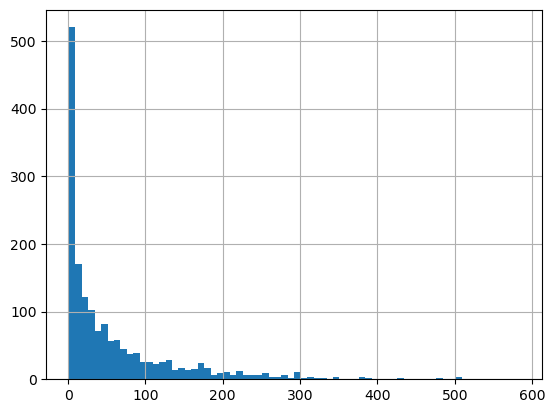

In [94]:
ratings['num of ratings'].hist(bins=70)

In [95]:
plt.show()

<Axes: >

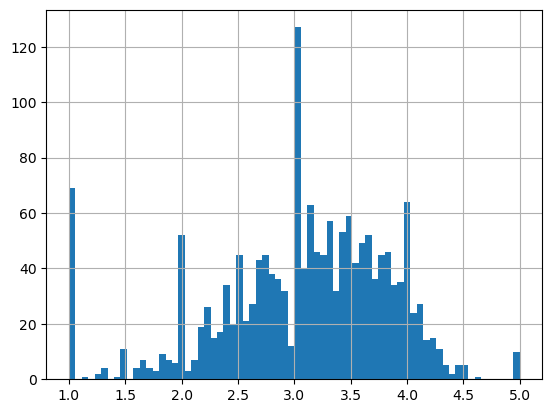

In [96]:
ratings['rating'].hist(bins=70)

In [97]:
plt.show()

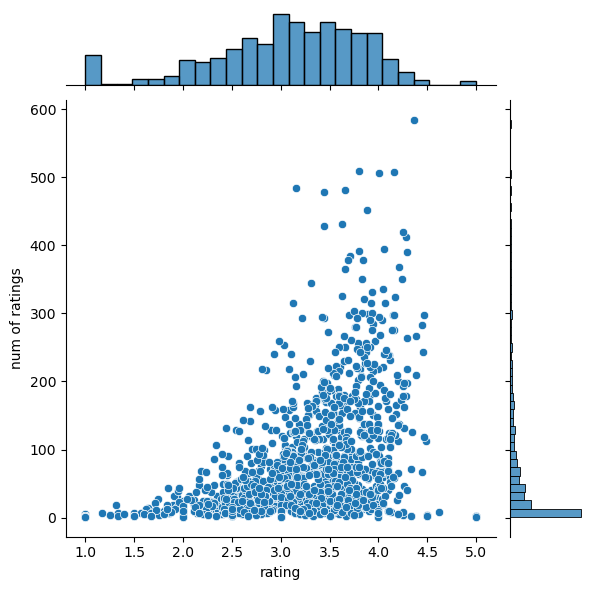

In [98]:
sns.jointplot(x='rating',y='num of ratings',data=ratings)

In [126]:
# 
df.head()

,user_id,item_id,rating,timestamp,title
0,0,50,5,881250949,Star Wars (1977)
1,0,172,5,881250949,"Empire Strikes Back, The (1980)"
2,0,133,1,881250949,Gone with the Wind (1939)
3,196,242,3,881250949,Kolya (1996)
4,186,302,3,891717742,L.A. Confidential (1997)


In [100]:
moviemat = df.pivot_table(index='user_id',columns='title',values='rating')

In [101]:
moviemat

title,'Til There Was You (1997),1-900 (1994),101 Dalmatians (1996),12 Angry Men (1957),187 (1997),2 Days in the Valley (1996),"20,000 Leagues Under the Sea (1954)",2001: A Space Odyssey (1968),3 Ninjas: High Noon At Mega Mountain (1998),"39 Steps, The (1935)",...,Yankee Zulu (1994),Year of the Horse (1997),You So Crazy (1994),Young Frankenstein (1974),Young Guns (1988),Young Guns II (1990),"Young Poisoner's Handbook, The (1995)",Zeus and Roxanne (1997),unknown,Á köldum klaka (Cold Fever) (1994)
user_id,,,,,,,,,,,,,,,,,,,,,
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,2.0,5.0,NaN,NaN,3.0,4.0,NaN,NaN,...,NaN,NaN,NaN,5.0,3.0,NaN,NaN,NaN,4.0,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
939,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
940,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
941,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [102]:
ratings.sort_values('num of ratings',ascending=False).head(10)

,rating,num of ratings
title,,
Star Wars (1977),4.359589,584
Contact (1997),3.803536,509
Fargo (1996),4.155512,508
Return of the Jedi (1983),4.007890,507
Liar Liar (1997),3.156701,485
"English Patient, The (1996)",3.656965,481
Scream (1996),3.441423,478
Toy Story (1995),3.878319,452
Air Force One (1997),3.631090,431


In [103]:
starwars_user_ratings = moviemat['Star Wars (1977)']
liarliar_user_ratings = moviemat['Liar Liar (1997)']

In [104]:
starwars_user_ratings.head()

user_id
0    5.0
1    5.0
2    5.0
3    NaN
4    5.0
Name: Star Wars (1977), dtype: float64

In [105]:
similar_to_starwars = moviemat.corrwith(starwars_user_ratings)

C:\Users\konde\Downloads\naviGATOR\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\konde\Downloads\naviGATOR\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\konde\Downloads\naviGATOR\Lib\site-packages\numpy\lib\function_base.py:2889: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
C:\Users\konde\Downloads\naviGATOR\Lib\site-packages\numpy\lib\function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
C:\Users\konde\Downloads\naviGATOR\Lib\site-packages\numpy\lib\function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


In [106]:
similar_to_liarliar = moviemat.corrwith(liarliar_user_ratings)

In [107]:
corr_starwars = pd.DataFrame(similar_to_starwars,columns=['correlation'])

In [108]:
corr_starwars.head()

,correlation
title,
'Til There Was You (1997),0.872872
1-900 (1994),-0.645497
101 Dalmatians (1996),0.211132
12 Angry Men (1957),0.184289
187 (1997),0.027398


In [109]:
corr_starwars.sort_values('correlation',ascending=False).head(10)

,correlation
title,
Hollow Reed (1996),1.0
Stripes (1981),1.0
Star Wars (1977),1.0
Man of the Year (1995),1.0
"Beans of Egypt, Maine, The (1994)",1.0
Safe Passage (1994),1.0
"Old Lady Who Walked in the Sea, The (Vieille qui marchait dans la mer, La) (1991)",1.0
"Outlaw, The (1943)",1.0
"Line King: Al Hirschfeld, The (1996)",1.0


In [114]:
if 'num of ratings' in corr_starwars.columns:
    corr_starwars.drop(columns=['num of ratings'], inplace=True)

corr_starwars = corr_starwars.join(ratings[['num of ratings']])


In [115]:
corr_starwars.head()

,correlation,num of ratings
title,,
'Til There Was You (1997),0.872872,9
1-900 (1994),-0.645497,5
101 Dalmatians (1996),0.211132,109
12 Angry Men (1957),0.184289,125
187 (1997),0.027398,41


In [116]:
corr_starwars[corr_starwars['num of ratings']>100].sort_values('correlation',ascending=False).head()

,correlation,num of ratings
title,,
Star Wars (1977),1.000000,584
"Empire Strikes Back, The (1980)",0.748353,368
Return of the Jedi (1983),0.672556,507
Raiders of the Lost Ark (1981),0.536117,420
Austin Powers: International Man of Mystery (1997),0.377433,130


In [118]:
corr_liarliar = pd.DataFrame(similar_to_liarliar,columns=['correlation'])

In [123]:
corr_liarliar.dropna(inplace=True)

In [124]:
corr_liarliar = corr_liarliar.join(ratings['num of ratings'])

In [125]:
corr_liarliar[corr_liarliar['num of ratings']>100].sort_values('correlation',ascending=False).head()

,correlation,num of ratings
title,,
Liar Liar (1997),1.000000,485
Batman Forever (1995),0.516968,114
"Mask, The (1994)",0.484650,129
Down Periscope (1996),0.472681,101
Con Air (1997),0.469828,137


# Natural language process

In [1]:
import nltk

In [2]:
# nltk.download_shell()

In [3]:
# import nltk
nltk.download('stopwords')


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\konde\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [4]:
messages = [line.strip()for line in open(r"C:\Users\konde\Downloads\Py-DS-ML-Bootcamp-master\Refactored_Py_DS_ML_Bootcamp-master\20-Natural-Language-Processing\smsspamcollection\SMSSpamCollection")]

In [5]:
messages[0]

'ham\tGo until jurong point, crazy.. Available only in bugis n great world la e buffet... Cine there got amore wat...'

In [6]:
# for mess_no,message in enumerate (messages[:10]):
#     print(message)
    
for mess_no, message in enumerate(messages[:10]):  # Fix the syntax here
    print(mess_no,message)  # Print each message individually
    print('\n')

0 ham	Go until jurong point, crazy.. Available only in bugis n great world la e buffet... Cine there got amore wat...


1 ham	Ok lar... Joking wif u oni...


2 spam	Free entry in 2 a wkly comp to win FA Cup final tkts 21st May 2005. Text FA to 87121 to receive entry question(std txt rate)T&C's apply 08452810075over18's


3 ham	U dun say so early hor... U c already then say...


4 ham	Nah I don't think he goes to usf, he lives around here though


5 spam	FreeMsg Hey there darling it's been 3 week's now and no word back! I'd like some fun you up for it still? Tb ok! XxX std chgs to send, Â£1.50 to rcv


6 ham	Even my brother is not like to speak with me. They treat me like aids patent.


7 ham	As per your request 'Melle Melle (Oru Minnaminunginte Nurungu Vettam)' has been set as your callertune for all Callers. Press *9 to copy your friends Callertune


8 spam	WINNER!! As a valued network customer you have been selected to receivea Â£900 prize reward! To claim call 09061701461. Claim cod

In [9]:
import pandas as pd

In [10]:
messages = pd.read_csv(r"C:\Users\konde\Downloads\Py-DS-ML-Bootcamp-master\Refactored_Py_DS_ML_Bootcamp-master\20-Natural-Language-Processing\smsspamcollection\SMSSpamCollection",sep='\t',names = ['label','message'])

In [11]:
messages.head()

,label,message
0,ham,"Go until jurong point, crazy.. Available only ..."
1,ham,Ok lar... Joking wif u oni...
2,spam,Free entry in 2 a wkly comp to win FA Cup fina...
3,ham,U dun say so early hor... U c already then say...
4,ham,"Nah I don't think he goes to usf, he lives aro..."


In [10]:
messages.describe()

,label,message
count,5572,5572
unique,2,5169
top,ham,"Sorry, I'll call later"
freq,4825,30


In [11]:
messages.groupby('label').describe()

message                                                               
        count unique                                                top freq
label                                                                       
ham      4825   4516                             Sorry, I'll call later   30
spam      747    653  Please call our customer service representativ...    4

In [12]:
# messages['length']=messages['message'].apply(len)

In [12]:
messages['length'] = messages['message'].apply(len)

In [13]:
messages.head()

,label,message,length
0,ham,"Go until jurong point, crazy.. Available only ...",111
1,ham,Ok lar... Joking wif u oni...,29
2,spam,Free entry in 2 a wkly comp to win FA Cup fina...,155
3,ham,U dun say so early hor... U c already then say...,49
4,ham,"Nah I don't think he goes to usf, he lives aro...",61


In [14]:
import matplotlib.pyplot as plt
import seaborn as sns

<Axes: ylabel='Frequency'>

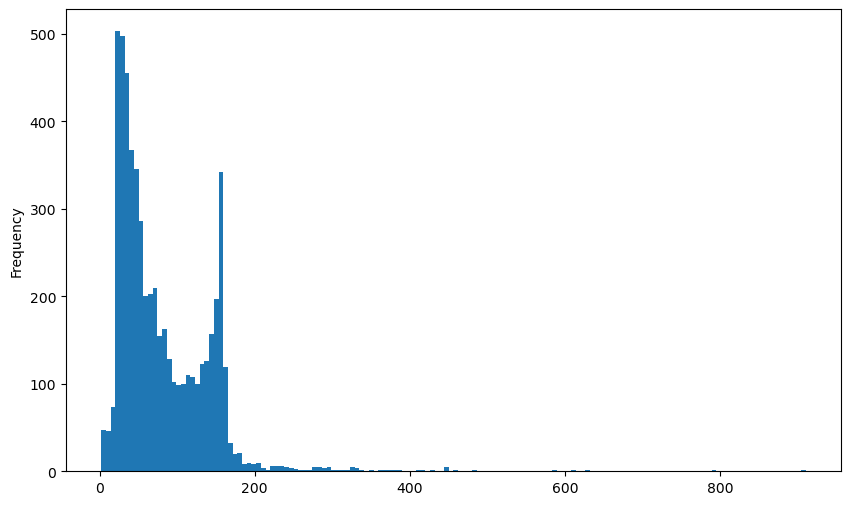

In [15]:
plt.figure(figsize=(10,6))
messages['length'].plot.hist(bins=150)

In [16]:
messages[messages['length']==910]['message'].iloc[0]
# messages[messages['length'] == 910]['message'].iloc[0]


"For me the love should start with attraction.i should feel that I need her every time around me.she should be the first thing which comes in my thoughts.I would start the day and end it with her.she should be there every time I dream.love will be then when my every breath has her name.my life should happen around her.my life will be named to her.I would cry for her.will give all my happiness and take all her sorrows.I will be ready to fight with anyone for her.I will be in love when I will be doing the craziest things for her.love will be when I don't have to proove anyone that my girl is the most beautiful lady on the whole planet.I will always be singing praises for her.love will be when I start up making chicken curry and end up makiing sambar.life will be the most beautiful then.will get every morning and thank god for the day because she is with me.I would like to say a lot..will tell later.."

array([<Axes: title={'center': 'ham'}>, <Axes: title={'center': 'spam'}>],
      dtype=object)

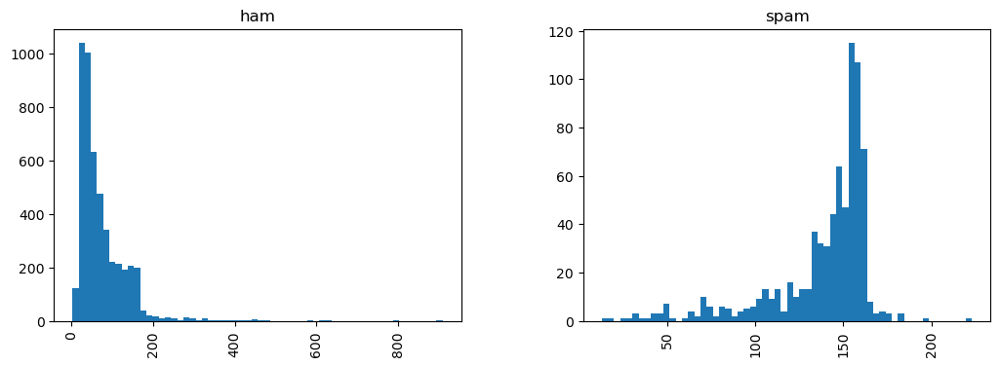

In [18]:
messages.hist(column='length',by='label',bins=60,figsize=(12,4))

In [20]:
import string

In [21]:
mess = 'sample message! Notice: it has punctuation.'

In [22]:
nonpunc=([c for c in mess if c not in string.punctuation])

In [23]:
nonpunc

['s',
 'a',
 'm',
 'p',
 'l',
 'e',
 ' ',
 'm',
 'e',
 's',
 's',
 'a',
 'g',
 'e',
 ' ',
 'N',
 'o',
 't',
 'i',
 'c',
 'e',
 ' ',
 'i',
 't',
 ' ',
 'h',
 'a',
 's',
 ' ',
 'p',
 'u',
 'n',
 'c',
 't',
 'u',
 'a',
 't',
 'i',
 'o',
 'n']

In [24]:
from nltk.corpus import stopwords 

In [26]:
# stopwords.words('english')

In [27]:
nonpunc = ''.join(nonpunc)
nonpunc

'sample message Notice it has punctuation'

In [28]:
# #example
# x=['a','b','c','d']
# ''.join(x)

In [29]:
nonpunc.split()

['sample', 'message', 'Notice', 'it', 'has', 'punctuation']

In [30]:
clean_mess = [word for word in nonpunc.split() if word.lower() not in stopwords.words('english')]


In [31]:
clean_mess

['sample', 'message', 'Notice', 'punctuation']

In [32]:
# def text_process(mess):
#     """
#     1.Remove punctuation
#     2.Remove stopwords
#     3.Return the list ofcleaned text 
#     """
#     nonpunc = [char for char in mess if char not in string.punctuation]
#     nonpunc = ''.join(nonpunc)
#     nonpunc = [word for word in nonpunc.split()if word.lower() not in stopwords.words('english')]

import string
from nltk.corpus import stopwords
import nltk

nltk.download('stopwords')

def text_process(mess):
    """
    1. Remove punctuation
    2. Remove stopwords
    3. Return the list of cleaned words
    """
    # Remove punctuation
    nonpunc = ''.join([char for char in mess if char not in string.punctuation])
    
    # Remove stopwords
    cleaned_words = [word for word in nonpunc.split() if word.lower() not in stopwords.words('english')]
    
    return cleaned_words


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\konde\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [33]:
messages.head()

,label,message,length
0,ham,"Go until jurong point, crazy.. Available only ...",111
1,ham,Ok lar... Joking wif u oni...,29
2,spam,Free entry in 2 a wkly comp to win FA Cup fina...,155
3,ham,U dun say so early hor... U c already then say...,49
4,ham,"Nah I don't think he goes to usf, he lives aro...",61


In [37]:
messages['message'].head(5).apply(text_process)

0    [Go, jurong, point, crazy, Available, bugis, n...
1                       [Ok, lar, Joking, wif, u, oni]
2    [Free, entry, 2, wkly, comp, win, FA, Cup, fin...
3        [U, dun, say, early, hor, U, c, already, say]
4    [Nah, dont, think, goes, usf, lives, around, t...
Name: message, dtype: object

In [38]:
from sklearn.feature_extraction.text import CountVectorizer

In [39]:
bow_transformer = CountVectorizer(analyzer=text_process).fit(messages['message'])

In [40]:
print(len(bow_transformer.vocabulary_))

11425


In [41]:
mess4 = messages['message'][3]

In [42]:
mess4

'U dun say so early hor... U c already then say...'

In [43]:
bow4 = bow_transformer.transform([mess4])

In [44]:
print(bow4)

  (0, 4068)	2
  (0, 4629)	1
  (0, 5261)	1
  (0, 6204)	1
  (0, 6222)	1
  (0, 7186)	1
  (0, 9554)	2


In [45]:
print(bow4.shape)

(1, 11425)


In [46]:
bow_transformer.get_feature_names_out()[9554]

'say'

In [47]:
messages_bow = bow_transformer.transform(messages['message'])

In [48]:
print('shape of sparse matrix:',messages_bow.shape)

shape of sparse matrix: (5572, 11425)


In [49]:
messages_bow.nnz

50548

In [50]:
sparsity = (100.0 * messages_bow.nnz / (messages_bow.shape[0] * messages_bow.shape[1]))
print('sparsity: {}'.format(round(sparsity)))

sparsity: 0


In [51]:
from sklearn.feature_extraction.text import TfidfTransformer

In [52]:
tfidf_transformer = TfidfTransformer().fit(messages_bow)

In [53]:
tfidf4 = tfidf_transformer.transform(bow4)

In [54]:
print(tfidf4)

  (0, 4068)	0.4083258993338407
  (0, 4629)	0.2661980190608719
  (0, 5261)	0.2972995740586873
  (0, 6204)	0.2995379972369742
  (0, 6222)	0.31872168929491496
  (0, 7186)	0.4389365653379858
  (0, 9554)	0.5385626262927565


In [55]:
tfidf_transformer.idf_[bow_transformer.vocabulary_['university']]

8.527076498901426

In [56]:
message_tfidf = tfidf_transformer.transform(messages_bow)

In [59]:
from sklearn.naive_bayes import MultinomialNB

In [62]:
spam_detect_model = MultinomialNB().fit(message_tfidf,messages['label'])

In [67]:
spam_detect_model.predict(tfidf4)[0]

'ham'

In [70]:
messages

,label,message,length
0,ham,"Go until jurong point, crazy.. Available only ...",111
1,ham,Ok lar... Joking wif u oni...,29
2,spam,Free entry in 2 a wkly comp to win FA Cup fina...,155
3,ham,U dun say so early hor... U c already then say...,49
4,ham,"Nah I don't think he goes to usf, he lives aro...",61
...,...,...,...
5567,spam,This is the 2nd time we have tried 2 contact u...,160
5568,ham,Will ü b going to esplanade fr home?,36
5569,ham,"Pity, * was in mood for that. So...any other s...",57
5570,ham,The guy did some bitching but I acted like i'd...,125


In [75]:
messages['label'][2]

'spam'

In [77]:
all_pred = spam_detect_model.predict(message_tfidf)

In [78]:
all_pred

array(['ham', 'ham', 'spam', ..., 'ham', 'ham', 'ham'], dtype='<U4')

In [79]:
from sklearn.model_selection import train_test_split

In [81]:
msg_train,msg_test,label_train,label_test = train_test_split(messages['message'],messages['label'],test_size=0.2,random_state=42)

In [84]:
from sklearn.pipeline import Pipeline

In [85]:
pipeline = Pipeline([
    ('bow',CountVectorizer(analyzer = text_process)),
    ('tfidf',TfidfTransformer()),
    ('classifier',MultinomialNB())
                    ])

In [86]:
pipeline.fit(msg_train,label_train)

Pipeline(steps=[('bow',
                 CountVectorizer(analyzer=<function text_process at 0x000001DDDB8631A0>)),
                ('tfidf', TfidfTransformer()),
                ('classifier', MultinomialNB())])

In [100]:
predictions = pipeline.predict(msg_test)

In [89]:
from sklearn.metrics import classification_report,confusion_matrix

In [91]:
print(classification_report(label_test,predictions))

              precision    recall  f1-score   support

         ham       0.97      1.00      0.98       966
        spam       1.00      0.77      0.87       149

    accuracy                           0.97      1115
   macro avg       0.98      0.88      0.92      1115
weighted avg       0.97      0.97      0.97      1115



In [94]:
#Random forest classifier

In [95]:
from sklearn.ensemble import RandomForestClassifier

In [96]:
pipeline = Pipeline([
    ('bow',CountVectorizer(analyzer = text_process)),
    ('tfidf',TfidfTransformer()),
    ('classifier',RandomForestClassifier())
                    ])

In [99]:
pipeline.fit(msg_train,label_train)

Pipeline(steps=[('bow',
                 CountVectorizer(analyzer=<function text_process at 0x000001DDDB8631A0>)),
                ('tfidf', TfidfTransformer()),
                ('classifier', RandomForestClassifier())])

In [101]:
predictions = pipeline.predict(msg_test)

In [102]:
from sklearn.metrics import classification_report,confusion_matrix

In [103]:
print(classification_report(label_test,predictions))

              precision    recall  f1-score   support

         ham       0.97      1.00      0.99       966
        spam       1.00      0.82      0.90       149

    accuracy                           0.98      1115
   macro avg       0.99      0.91      0.94      1115
weighted avg       0.98      0.98      0.97      1115



In [172]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [173]:
yelp = pd.read_csv(r"C:\Users\konde\Downloads\Py-DS-ML-Bootcamp-master\Refactored_Py_DS_ML_Bootcamp-master\20-Natural-Language-Processing\yelp.csv")

In [174]:
yelp.head()

,business_id,date,review_id,stars,text,type,user_id,cool,useful,funny
0,9yKzy9PApeiPPOUJEtnvkg,2011-01-26,fWKvX83p0-ka4JS3dc6E5A,5,My wife took me here on my birthday for breakf...,review,rLtl8ZkDX5vH5nAx9C3q5Q,2,5,0
1,ZRJwVLyzEJq1VAihDhYiow,2011-07-27,IjZ33sJrzXqU-0X6U8NwyA,5,I have no idea why some people give bad review...,review,0a2KyEL0d3Yb1V6aivbIuQ,0,0,0
2,6oRAC4uyJCsJl1X0WZpVSA,2012-06-14,IESLBzqUCLdSzSqm0eCSxQ,4,love the gyro plate. Rice is so good and I als...,review,0hT2KtfLiobPvh6cDC8JQg,0,1,0
3,_1QQZuf4zZOyFCvXc0o6Vg,2010-05-27,G-WvGaISbqqaMHlNnByodA,5,"Rosie, Dakota, and I LOVE Chaparral Dog Park!!...",review,uZetl9T0NcROGOyFfughhg,1,2,0
4,6ozycU1RpktNG2-1BroVtw,2012-01-05,1uJFq2r5QfJG_6ExMRCaGw,5,General Manager Scott Petello is a good egg!!!...,review,vYmM4KTsC8ZfQBg-j5MWkw,0,0,0


In [175]:
yelp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   business_id  10000 non-null  object
 1   date         10000 non-null  object
 2   review_id    10000 non-null  object
 3   stars        10000 non-null  int64 
 4   text         10000 non-null  object
 5   type         10000 non-null  object
 6   user_id      10000 non-null  object
 7   cool         10000 non-null  int64 
 8   useful       10000 non-null  int64 
 9   funny        10000 non-null  int64 
dtypes: int64(4), object(6)
memory usage: 781.4+ KB


In [176]:
yelp.describe()

,stars,cool,useful,funny
count,10000.000000,10000.000000,10000.000000,10000.000000
mean,3.777500,0.876800,1.409300,0.701300
std,1.214636,2.067861,2.336647,1.907942
min,1.000000,0.000000,0.000000,0.000000
25%,3.000000,0.000000,0.000000,0.000000
50%,4.000000,0.000000,1.000000,0.000000
75%,5.000000,1.000000,2.000000,1.000000
max,5.000000,77.000000,76.000000,57.000000


In [177]:
yelp['text_length'] = yelp['text'].apply(len)

In [178]:
yelp.head()

,business_id,date,review_id,stars,text,type,user_id,cool,useful,funny,text_length
0,9yKzy9PApeiPPOUJEtnvkg,2011-01-26,fWKvX83p0-ka4JS3dc6E5A,5,My wife took me here on my birthday for breakf...,review,rLtl8ZkDX5vH5nAx9C3q5Q,2,5,0,889
1,ZRJwVLyzEJq1VAihDhYiow,2011-07-27,IjZ33sJrzXqU-0X6U8NwyA,5,I have no idea why some people give bad review...,review,0a2KyEL0d3Yb1V6aivbIuQ,0,0,0,1345
2,6oRAC4uyJCsJl1X0WZpVSA,2012-06-14,IESLBzqUCLdSzSqm0eCSxQ,4,love the gyro plate. Rice is so good and I als...,review,0hT2KtfLiobPvh6cDC8JQg,0,1,0,76
3,_1QQZuf4zZOyFCvXc0o6Vg,2010-05-27,G-WvGaISbqqaMHlNnByodA,5,"Rosie, Dakota, and I LOVE Chaparral Dog Park!!...",review,uZetl9T0NcROGOyFfughhg,1,2,0,419
4,6ozycU1RpktNG2-1BroVtw,2012-01-05,1uJFq2r5QfJG_6ExMRCaGw,5,General Manager Scott Petello is a good egg!!!...,review,vYmM4KTsC8ZfQBg-j5MWkw,0,0,0,469


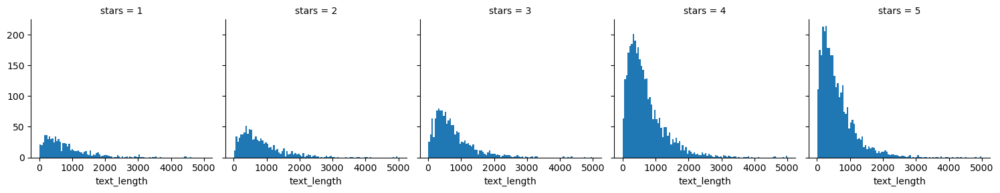

In [179]:
g = sns.FacetGrid(yelp,col='stars')
g.map(plt.hist,'text_length',bins=100)

<Axes: xlabel='stars', ylabel='text_length'>

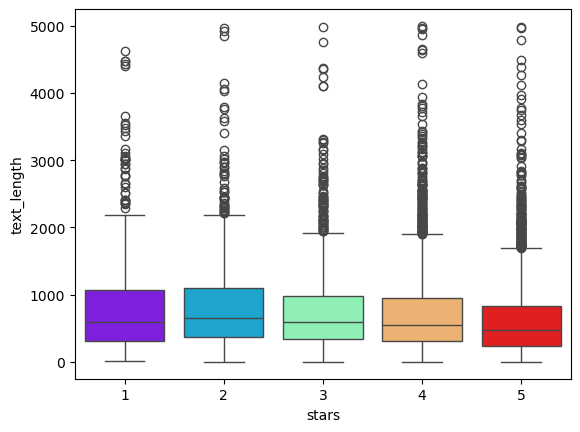

In [180]:
sns.boxplot(x='stars',y='text_length',data=yelp,palette='rainbow',hue = 'stars',legend =False)

<Axes: xlabel='stars', ylabel='count'>

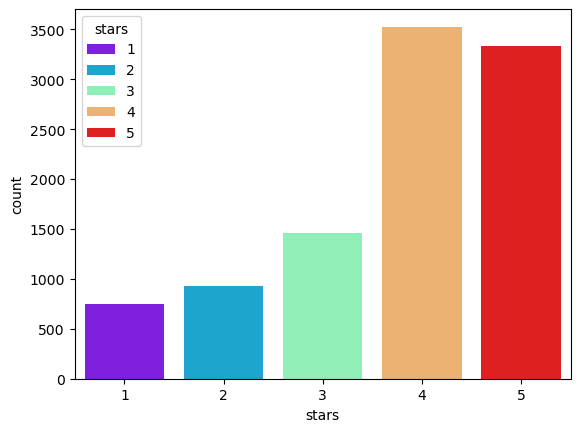

In [181]:
sns.countplot(x='stars',data=yelp,palette = 'rainbow',hue= 'stars')

In [182]:
# stars = yelp.groupby('stars').mean()
stars = yelp.groupby('stars').mean(numeric_only=True)
(stars)



,cool,useful,funny,text_length
stars,,,,
1,0.576769,1.604806,1.056075,826.515354
2,0.719525,1.563107,0.875944,842.256742
3,0.788501,1.306639,0.694730,758.498289
4,0.954623,1.395916,0.670448,712.923142
5,0.944261,1.381780,0.608631,624.999101


In [183]:
stars.corr()

,cool,useful,funny,text_length
cool,1.000000,-0.743329,-0.944939,-0.857664
useful,-0.743329,1.000000,0.894506,0.699881
funny,-0.944939,0.894506,1.000000,0.843461
text_length,-0.857664,0.699881,0.843461,1.000000


<Axes: >

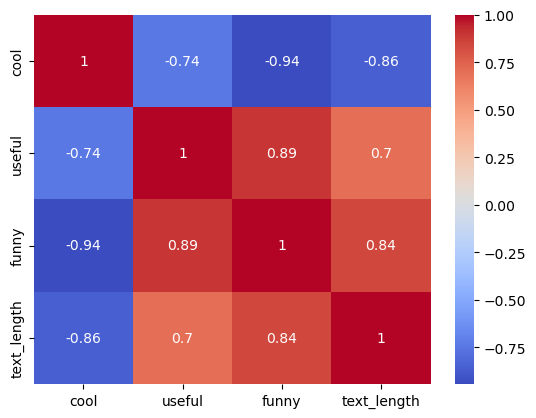

In [184]:
sns.heatmap(stars.corr(),cmap='coolwarm',annot =True)

In [185]:
yelp_class = yelp[(yelp['stars']==1)|(yelp['stars']==5)]
yelp_class.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4086 entries, 0 to 9999
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   business_id  4086 non-null   object
 1   date         4086 non-null   object
 2   review_id    4086 non-null   object
 3   stars        4086 non-null   int64 
 4   text         4086 non-null   object
 5   type         4086 non-null   object
 6   user_id      4086 non-null   object
 7   cool         4086 non-null   int64 
 8   useful       4086 non-null   int64 
 9   funny        4086 non-null   int64 
 10  text_length  4086 non-null   int64 
dtypes: int64(5), object(6)
memory usage: 383.1+ KB


In [186]:
x=yelp_class['text']
y=yelp_class['stars']

In [187]:
from sklearn.feature_extraction.text import CountVectorizer

In [188]:
cv =CountVectorizer()

In [189]:
X=cv.fit_transform(x)

In [190]:
from sklearn.model_selection import train_test_split

In [191]:
 X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.3, random_state=42)

In [192]:
from sklearn.naive_bayes import MultinomialNB
nb=MultinomialNB()

In [193]:
nb.fit(X_train,y_train)

MultinomialNB()

In [194]:
pred = nb.predict(X_test)

In [195]:
from sklearn.metrics import classification_report,confusion_matrix

In [196]:
print(classification_report(pred,y_test))
print('\n')
print(confusion_matrix(pred,y_test))

              precision    recall  f1-score   support

           1       0.67      0.81      0.73       193
           5       0.96      0.93      0.94      1033

    accuracy                           0.91      1226
   macro avg       0.82      0.87      0.84      1226
weighted avg       0.92      0.91      0.91      1226



[[156  37]
 [ 77 956]]


In [216]:
from sklearn.feature_extraction.text import  TfidfTransformer
from sklearn.pipeline import Pipeline
pipe = Pipeline([
    ('bow', CountVectorizer()),  # strings to token integer counts
    ('tfidf', TfidfTransformer()),  # integer counts to weighted TF-IDF scores
    ('classifier', MultinomialNB()),  # train on TF-IDF vectors w/ Naive Bayes classifier
])

In [217]:
X = yelp_class['text']
y = yelp_class['stars']
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.3,random_state=101)

In [218]:
# May take some time
pipe.fit(X_train,y_train)

Pipeline(steps=[('bow', CountVectorizer()), ('tfidf', TfidfTransformer()),
                ('classifier', MultinomialNB())])

In [219]:
predictions = pipe.predict(X_test)

In [222]:
print(confusion_matrix(y_test,predictions))
print(classification_report(y_test,predictions))

[[  0 228]
 [  0 998]]
              precision    recall  f1-score   support

           1       0.00      0.00      0.00       228
           5       0.81      1.00      0.90       998

    accuracy                           0.81      1226
   macro avg       0.41      0.50      0.45      1226
weighted avg       0.66      0.81      0.73      1226



C:\Users\konde\Downloads\naviGATOR\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\konde\Downloads\naviGATOR\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\konde\Downloads\naviGATOR\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [221]:
# import numpy as np

# unique, counts = np.unique(y_train, return_counts=True)
# print(dict(zip(unique, counts)))  # Shows class distribution
